# Taco dataset image segmentation

## Load data

In [3]:
!gdown 1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF
!unzip taco.zip -d /content/

Downloading...
From (original): https://drive.google.com/uc?id=1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF
From (redirected): https://drive.google.com/uc?id=1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF&confirm=t&uuid=c20bc27b-14ae-4cfa-94b5-f9b1d078c67c
To: /content/taco.zip
100% 5.23G/5.23G [01:58<00:00, 44.0MB/s]
Archive:  taco.zip
   creating: /content/content/drive/MyDrive/taco_dataset/taco/
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/annotations.json  
   creating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000011.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000007.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000004.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000000.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000014.jpg  
  inflating: /content/content/drive/MyDrive/taco_

## Load packages

In [4]:
!pip install torchmetrics pycocotools

In [41]:
import os
import pandas as pd
import json
import tqdm

import ast
from PIL import Image, ImageDraw
import os
import torch

import numpy as np
from torchvision.io import read_image
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F
from torch.utils.data import Dataset, Subset, DataLoader, random_split, WeightedRandomSampler
from torch import nn
import random
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torch.utils.tensorboard import SummaryWriter
from matplotlib import colors, pyplot as plt
%matplotlib inline

In [6]:
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

In [7]:
torch.cuda.current_device()
torch.cuda.get_device_name(0)
device = torch.device("cuda")
device

device(type='cuda')

In [8]:
TACO_CLASSIFICATION_PATH = '/content/taco/'
ann_path = os.path.join(TACO_CLASSIFICATION_PATH, "annotations.json")
with open(ann_path, "r") as f:
    data = json.load(f)

data.keys()

dict_keys(['info', 'images', 'annotations', 'scene_annotations', 'licenses', 'categories', 'scene_categories'])

In [9]:
df_images = pd.DataFrame(data["images"])
df_annotations = pd.DataFrame(data["annotations"])
df_categories = pd.DataFrame(data["categories"])
df_scene_annotations = pd.DataFrame(data["scene_annotations"])
df_categories = pd.DataFrame(data["categories"])
df_scene_categories = pd.DataFrame(data["scene_categories"])

In [10]:
df_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              1500 non-null   int64 
 1   width           1500 non-null   int64 
 2   height          1500 non-null   int64 
 3   file_name       1500 non-null   object
 4   license         785 non-null    object
 5   flickr_url      1500 non-null   object
 6   coco_url        0 non-null      object
 7   date_captured   0 non-null      object
 8   flickr_640_url  1034 non-null   object
dtypes: int64(3), object(6)
memory usage: 105.6+ KB


In [11]:
def parse_bbox(v):
    if isinstance(v, str):
        return ast.literal_eval(v)
    return v

df = df_annotations.merge(
    df_images,
    left_on="image_id",
    right_on="id",
    how="left",
    suffixes=("", "_img"),
).merge(
    df_categories,
    left_on="category_id",
    right_on="id",
    how="left",
    suffixes=("", "_cat"),
).rename(
    columns={
        "id_x": "annotation_id",
        "id_y": "category_id_full",
        "name": "category_name",
    }
)
df['file_path'] = df['file_name'].map(lambda x: os.path.join(TACO_CLASSIFICATION_PATH, x) )

In [8]:
df

,id,image_id,category_id,segmentation,area,bbox,iscrowd,id_img,width,height,file_name,license,flickr_url,coco_url,date_captured,flickr_640_url,supercategory,id_cat,category_name,file_path
0,1,0,6,"[[561.0, 1238.0, 568.0, 1201.0, 567.0, 1175.0,...",4.039540e+05,"[517.0, 127.0, 447.0, 1322.0]",0,0,1537,2049,batch_1/000006.jpg,None,https://farm66.staticflickr.com/65535/33978196...,None,None,https://farm66.staticflickr.com/65535/33978196...,Bottle,6,Glass bottle,/content/taco/batch_1/000006.jpg
1,2,1,18,"[[928.0, 1876.0, 938.0, 1856.0, 968.0, 1826.0,...",1.071260e+06,"[1.0, 457.0, 1429.0, 1519.0]",0,1,1537,2049,batch_1/000008.jpg,None,https://farm66.staticflickr.com/65535/47803331...,None,None,https://farm66.staticflickr.com/65535/47803331...,Carton,18,Meal carton,/content/taco/batch_1/000008.jpg
2,3,1,14,"[[617.0, 383.0, 703.0, 437.0, 713.0, 456.0, 72...",9.958350e+04,"[531.0, 292.0, 1006.0, 672.0]",0,1,1537,2049,batch_1/000008.jpg,None,https://farm66.staticflickr.com/65535/47803331...,None,None,https://farm66.staticflickr.com/65535/47803331...,Carton,14,Other carton,/content/taco/batch_1/000008.jpg
3,4,2,5,"[[670.0, 993.0, 679.0, 998.0, 684.0, 1001.0, 6...",7.383250e+04,"[632.0, 987.0, 500.0, 374.0]",0,2,1537,2049,batch_1/000010.jpg,None,https://farm66.staticflickr.com/65535/40888872...,None,None,https://farm66.staticflickr.com/65535/40888872...,Bottle,5,Clear plastic bottle,/content/taco/batch_1/000010.jpg
4,5,2,7,"[[647.0, 1028.0, 650.0, 1022.0, 653.0, 1016.0,...",9.150000e+02,"[632.0, 989.0, 44.0, 51.0]",0,2,1537,2049,batch_1/000010.jpg,None,https://farm66.staticflickr.com/65535/40888872...,None,None,https://farm66.staticflickr.com/65535/40888872...,Bottle cap,7,Plastic bottle cap,/content/taco/batch_1/000010.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4779,4779,1498,16,"[[386, 1557, 635, 1567, 986, 1556, 1178, 1550,...",5.032469e+05,"[228.7143, 1550.0476, 1007.9998999999999, 578....",0,1498,1824,4000,batch_9/000098.jpg,CC,https://farm66.staticflickr.com/65535/48693804...,None,None,https://farm66.staticflickr.com/65535/48693804...,Carton,16,Drink carton,/content/taco/batch_9/000098.jpg
4780,4780,1498,7,"[[1057, 1824, 1041, 1793, 1042, 1758, 1062, 17...",1.449450e+04,"[1041.3334, 1721.7142, 141.0, 138.0]",0,1498,1824,4000,batch_9/000098.jpg,CC,https://farm66.staticflickr.com/65535/48693804...,None,None,https://farm66.staticflickr.com/65535/48693804...,Bottle cap,7,Plastic bottle cap,/content/taco/batch_9/000098.jpg
4781,4781,1499,39,"[[1368, 1775, 1099, 1331, 862, 1494, 1099, 1944]]",1.549541e+05,"[862.0274, 1331.25, 505.97260000000006, 612.5]",0,1499,1824,4000,batch_9/000099.jpg,CC,https://farm66.staticflickr.com/65535/48701147...,None,None,https://farm66.staticflickr.com/65535/48701147...,Plastic bag & wrapper,39,Other plastic wrapper,/content/taco/batch_9/000099.jpg
4782,4782,1499,14,"[[1096, 1996, 1121, 2069, 1134, 2127, 1177, 22...",2.867500e+04,"[966.0, 1996.0, 211.0, 336.0]",0,1499,1824,4000,batch_9/000099.jpg,CC,https://farm66.staticflickr.com/65535/48701147...,None,None,https://farm66.staticflickr.com/65535/48701147...,Carton,14,Other carton,/content/taco/batch_9/000099.jpg


In [ ]:
df['category_name'].value_counts()

,count
category_name,
Cigarette,667
Unlabeled litter,517
Plastic film,451
Clear plastic bottle,285
Other plastic,273
Other plastic wrapper,260
Drink can,229
Plastic bottle cap,209
Plastic straw,157


In [19]:
class_names = df['category_name'].value_counts()

In [18]:
df['supercategory'].value_counts()

,count
supercategory,
Plastic bag & wrapper,850
Cigarette,667
Unlabeled litter,517
Bottle,439
Bottle cap,289
Can,273
Other plastic,273
Carton,251
Cup,192


## Exploratory data analysis

In [15]:
df_categories.head(5)

,supercategory,id,name
0,Aluminium foil,0,Aluminium foil
1,Battery,1,Battery
2,Blister pack,2,Aluminium blister pack
3,Blister pack,3,Carded blister pack
4,Bottle,4,Other plastic bottle


In [10]:
df_categories['supercategory'].nunique()

28

In [11]:
df_categories['name'].nunique()

60

### Images

#### Display original image

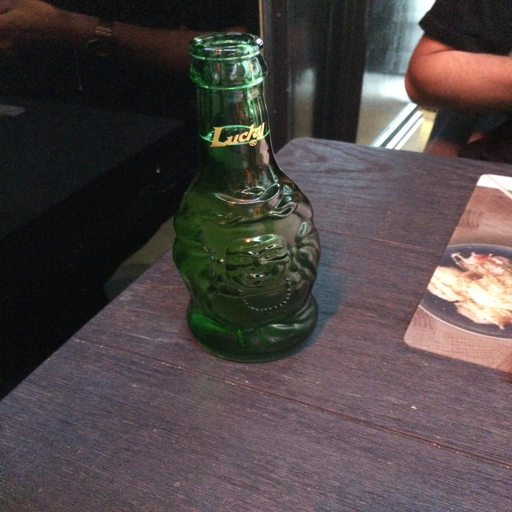

In [ ]:
row = df.iloc[0]
img = Image.open(row["file_path"]).convert("RGB")
img.resize((512, 512))

#### Display image with bboxes

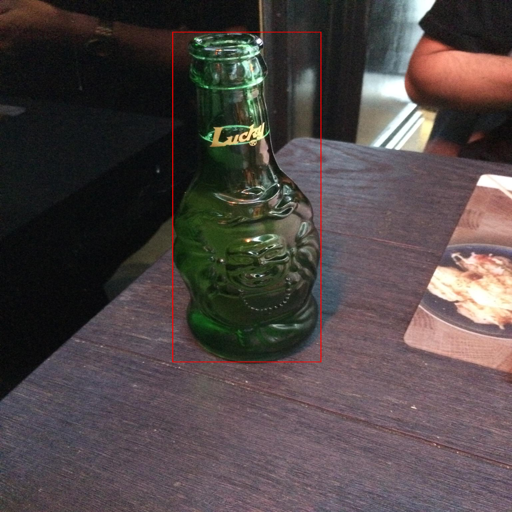

In [13]:
img = Image.open(row["file_path"]).convert("RGB")
draw = ImageDraw.Draw(img, "RGBA")
bbox = ast.literal_eval(row["bbox"]) if isinstance(row["bbox"], str) else row["bbox"]
x, y, w, h = bbox
# Since coc format is [x_min, y_min, width, height]
# and PIL accepts [x_min, y_min, x_max, y_max], so it requires transformation
# x_max = x + width
# y_max = y + height
box = [x, y, x + w, y + h]
draw.rectangle(box, outline="red", width=3)
img.resize((512, 512))

#### Display image with segmentations

In [14]:
segmentation = ast.literal_eval(row["segmentation"]) if isinstance(row["segmentation"], str) else row["segmentation"]
segmentation

[[561.0,
  1238.0,
  568.0,
  1201.0,
  567.0,
  1175.0,
  549.0,
  1127.0,
  538.0,
  1089.0,
  519.0,
  1043.0,
  517.0,
  1005.0,
  523.0,
  964.0,
  529.0,
  945.0,
  520.0,
  896.0,
  525.0,
  862.0,
  536.0,
  821.0,
  554.0,
  769.0,
  577.0,
  727.0,
  595.0,
  678.0,
  596.0,
  585.0,
  588.0,
  346.0,
  581.0,
  328.0,
  569.0,
  306.0,
  570.0,
  276.0,
  576.0,
  224.0,
  560.0,
  205.0,
  564.0,
  170.0,
  578.0,
  154.0,
  608.0,
  136.0,
  649.0,
  127.0,
  688.0,
  127.0,
  726.0,
  129.0,
  759.0,
  141.0,
  784.0,
  153.0,
  792.0,
  177.0,
  788.0,
  193.0,
  782.0,
  209.0,
  792.0,
  238.0,
  802.0,
  271.0,
  802.0,
  294.0,
  791.0,
  319.0,
  789.0,
  360.0,
  794.0,
  395.0,
  810.0,
  529.0,
  819.0,
  609.0,
  841.0,
  675.0,
  882.0,
  728.0,
  916.0,
  781.0,
  928.0,
  802.0,
  938.0,
  834.0,
  940.0,
  856.0,
  939.0,
  873.0,
  938.0,
  884.0,
  944.0,
  901.0,
  951.0,
  917.0,
  956.0,
  942.0,
  960.0,
  972.0,
  964.0,
  1013.0,
  959.0,
  1036.0,
 

This list is a sequence of coordinates, like

```python
[x1, y1, x2, y2, x3, y3, ...]
```

It is required to transform it to the list of corrdinates:

```python
[(x1, y1), (x2, y2), (x3, y3)]
```

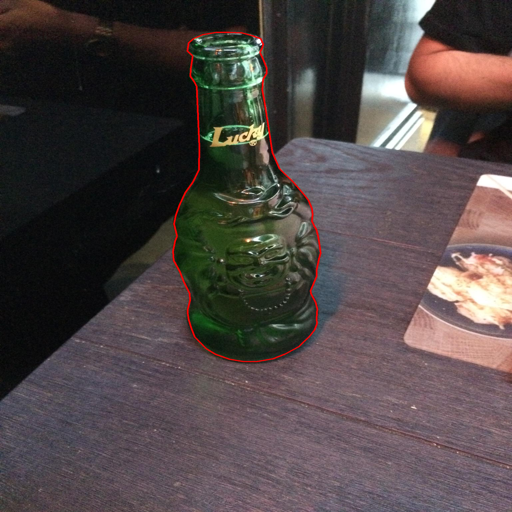

In [15]:
img = Image.open(row["file_path"]).convert("RGB")
draw = ImageDraw.Draw(img, "RGBA")
for seg in segmentation:
  # Iterate through the list with step 2
  polygon = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
  draw.polygon(
      polygon,
      # For filling the object completely
      # fill=(0, 255, 0, 80),
      outline="red",
      width=5
    )
img.resize((512, 512))

## Dataset

In [ ]:

# if torch.backends.mps.is_available():
#     torch.mps.manual_seed(seed)


device(type='cuda')

In [86]:
df.groupby('image_id').head(5)

,id,image_id,category_id,segmentation,area,bbox,iscrowd,id_img,width,height,file_name,license,flickr_url,coco_url,date_captured,flickr_640_url,supercategory,id_cat,category_name,file_path
0,1,0,6,"[[561.0, 1238.0, 568.0, 1201.0, 567.0, 1175.0,...",4.039540e+05,"[517.0, 127.0, 447.0, 1322.0]",0,0,1537,2049,batch_1/000006.jpg,None,https://farm66.staticflickr.com/65535/33978196...,None,None,https://farm66.staticflickr.com/65535/33978196...,Bottle,6,Glass bottle,/content/taco/batch_1/000006.jpg
1,2,1,18,"[[928.0, 1876.0, 938.0, 1856.0, 968.0, 1826.0,...",1.071260e+06,"[1.0, 457.0, 1429.0, 1519.0]",0,1,1537,2049,batch_1/000008.jpg,None,https://farm66.staticflickr.com/65535/47803331...,None,None,https://farm66.staticflickr.com/65535/47803331...,Carton,18,Meal carton,/content/taco/batch_1/000008.jpg
2,3,1,14,"[[617.0, 383.0, 703.0, 437.0, 713.0, 456.0, 72...",9.958350e+04,"[531.0, 292.0, 1006.0, 672.0]",0,1,1537,2049,batch_1/000008.jpg,None,https://farm66.staticflickr.com/65535/47803331...,None,None,https://farm66.staticflickr.com/65535/47803331...,Carton,14,Other carton,/content/taco/batch_1/000008.jpg
3,4,2,5,"[[670.0, 993.0, 679.0, 998.0, 684.0, 1001.0, 6...",7.383250e+04,"[632.0, 987.0, 500.0, 374.0]",0,2,1537,2049,batch_1/000010.jpg,None,https://farm66.staticflickr.com/65535/40888872...,None,None,https://farm66.staticflickr.com/65535/40888872...,Bottle,5,Clear plastic bottle,/content/taco/batch_1/000010.jpg
4,5,2,7,"[[647.0, 1028.0, 650.0, 1022.0, 653.0, 1016.0,...",9.150000e+02,"[632.0, 989.0, 44.0, 51.0]",0,2,1537,2049,batch_1/000010.jpg,None,https://farm66.staticflickr.com/65535/40888872...,None,None,https://farm66.staticflickr.com/65535/40888872...,Bottle cap,7,Plastic bottle cap,/content/taco/batch_1/000010.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4779,4779,1498,16,"[[386, 1557, 635, 1567, 986, 1556, 1178, 1550,...",5.032469e+05,"[228.7143, 1550.0476, 1007.9998999999999, 578....",0,1498,1824,4000,batch_9/000098.jpg,CC,https://farm66.staticflickr.com/65535/48693804...,None,None,https://farm66.staticflickr.com/65535/48693804...,Carton,16,Drink carton,/content/taco/batch_9/000098.jpg
4780,4780,1498,7,"[[1057, 1824, 1041, 1793, 1042, 1758, 1062, 17...",1.449450e+04,"[1041.3334, 1721.7142, 141.0, 138.0]",0,1498,1824,4000,batch_9/000098.jpg,CC,https://farm66.staticflickr.com/65535/48693804...,None,None,https://farm66.staticflickr.com/65535/48693804...,Bottle cap,7,Plastic bottle cap,/content/taco/batch_9/000098.jpg
4781,4781,1499,39,"[[1368, 1775, 1099, 1331, 862, 1494, 1099, 1944]]",1.549541e+05,"[862.0274, 1331.25, 505.97260000000006, 612.5]",0,1499,1824,4000,batch_9/000099.jpg,CC,https://farm66.staticflickr.com/65535/48701147...,None,None,https://farm66.staticflickr.com/65535/48701147...,Plastic bag & wrapper,39,Other plastic wrapper,/content/taco/batch_9/000099.jpg
4782,4782,1499,14,"[[1096, 1996, 1121, 2069, 1134, 2127, 1177, 22...",2.867500e+04,"[966.0, 1996.0, 211.0, 336.0]",0,1499,1824,4000,batch_9/000099.jpg,CC,https://farm66.staticflickr.com/65535/48701147...,None,None,https://farm66.staticflickr.com/65535/48701147...,Carton,14,Other carton,/content/taco/batch_9/000099.jpg


In [87]:
df_categories

,supercategory,id,name
0,Aluminium foil,0,Aluminium foil
1,Battery,1,Battery
2,Blister pack,2,Aluminium blister pack
3,Blister pack,3,Carded blister pack
4,Bottle,4,Other plastic bottle
5,Bottle,5,Clear plastic bottle
6,Bottle,6,Glass bottle
7,Bottle cap,7,Plastic bottle cap
8,Bottle cap,8,Metal bottle cap
9,Broken glass,9,Broken glass


In [28]:
def polygons_to_masks(segmentation, height, width):
    masks = []

    for seg in segmentation:
        # Create empty mask
        mask = Image.new("L", (width, height), 0)
        draw = ImageDraw.Draw(mask)

        # Create corrdinates tuples
        polygon = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]

        # Fill this mask in empty mask image
        draw.polygon(polygon, outline=1, fill=1)

        #  PIL => numpy => torch
        mask = torch.from_numpy(np.array(mask, dtype=np.uint8))

        masks.append(mask)

    # Combine
    if len(masks) > 0:
        masks = torch.stack(masks)  # [N, H, W]
    else:
        masks = torch.zeros((0, height, width), dtype=torch.uint8)

    return masks

class TacoDataset(Dataset):
    def __init__(self, df, label_map):
        self.image_groups = list(df.groupby('image_id'))
        self.label_map = label_map

    def __getitem__(self, idx):
        image_id, group = self.image_groups[idx]
        file_path = group.iloc[0]["file_path"]
        img = read_image(file_path).float() / 255.0
        _, H, W = img.shape
        boxes = []
        labels = []
        masks = []
        for _, row in group.iterrows():
            # Define box
            bbox = ast.literal_eval(row["bbox"]) if isinstance(row["bbox"], str) else row["bbox"]
            x, y, w, h = bbox
            boxes.append([x, y, x + w, y + h])

            # Define mask
            segmentation = ast.literal_eval(row["segmentation"]) if isinstance(row["segmentation"], str) else row["segmentation"]
            mask = polygons_to_masks(segmentation, H, W)
            masks.append(mask.sum(dim=0).clamp(max=1).to(torch.uint8))
            labels.append(self.label_map[row['category_id']])

        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64),
            "masks": torch.stack(masks),
        }
        return img, target

    def __len__(self):
        return len(self.image_groups)



### Test

In [29]:
cat_ids = sorted(df["category_id"].unique())
label_map = {cat_id: i + 1 for i, cat_id in enumerate(cat_ids)}
num_classes = len(label_map) + 1
dataset = TacoDataset(df=df, label_map=label_map)
img, target = dataset[1]

In [9]:
img

tensor([[[0.9686, 0.9725, 0.9765,  ..., 0.4549, 0.4510, 0.4471],
         [0.9725, 0.9725, 0.9765,  ..., 0.4471, 0.4510, 0.4431],
         [0.9765, 0.9765, 0.9804,  ..., 0.4471, 0.4549, 0.4588],
         ...,
         [0.7059, 0.7020, 0.6980,  ..., 0.4157, 0.4235, 0.4235],
         [0.7137, 0.7059, 0.7020,  ..., 0.4118, 0.4118, 0.4078],
         [0.7255, 0.7137, 0.7020,  ..., 0.4157, 0.3922, 0.4000]],

        [[0.9686, 0.9725, 0.9765,  ..., 0.2706, 0.2667, 0.2588],
         [0.9725, 0.9725, 0.9765,  ..., 0.2627, 0.2667, 0.2549],
         [0.9765, 0.9765, 0.9804,  ..., 0.2627, 0.2706, 0.2706],
         ...,
         [0.5373, 0.5333, 0.5294,  ..., 0.2314, 0.2392, 0.2471],
         [0.5451, 0.5373, 0.5333,  ..., 0.2275, 0.2353, 0.2392],
         [0.5647, 0.5529, 0.5373,  ..., 0.2353, 0.2196, 0.2275]],

        [[0.9608, 0.9647, 0.9686,  ..., 0.0980, 0.0863, 0.0706],
         [0.9647, 0.9647, 0.9686,  ..., 0.0902, 0.0863, 0.0667],
         [0.9686, 0.9686, 0.9725,  ..., 0.0902, 0.0902, 0.

In [106]:
target['boxes']

tensor([[1.0000e+00, 4.5700e+02, 1.4300e+03, 1.9760e+03],
        [5.3100e+02, 2.9200e+02, 1.5370e+03, 9.6400e+02]])

In [107]:
target['labels']

tensor([19, 15])

In [108]:
target['masks']

tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]], dtype=torch.uint8)

## Dataloader

In [31]:
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(
    dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

In [58]:
train_dataset.indices

[42,
 340,
 1028,
 766,
 1150,
 1160,
 1300,
 791,
 458,
 989,
 968,
 139,
 1046,
 1051,
 217,
 532,
 1107,
 749,
 111,
 239,
 489,
 554,
 1397,
 1111,
 599,
 663,
 709,
 1086,
 987,
 1299,
 732,
 823,
 1135,
 112,
 959,
 659,
 191,
 1461,
 1184,
 966,
 646,
 963,
 259,
 1185,
 71,
 533,
 35,
 1426,
 1113,
 781,
 970,
 312,
 1390,
 1346,
 1186,
 1414,
 1071,
 401,
 894,
 395,
 206,
 557,
 632,
 796,
 630,
 256,
 87,
 1138,
 23,
 121,
 247,
 618,
 1216,
 141,
 794,
 38,
 1343,
 1082,
 1130,
 789,
 1314,
 463,
 1270,
 757,
 370,
 1350,
 953,
 492,
 1491,
 901,
 487,
 549,
 605,
 756,
 997,
 440,
 1309,
 378,
 1173,
 668,
 770,
 1090,
 999,
 1377,
 261,
 426,
 493,
 1454,
 745,
 812,
 635,
 411,
 627,
 1311,
 128,
 124,
 1284,
 1483,
 1073,
 552,
 719,
 664,
 1485,
 9,
 976,
 579,
 18,
 944,
 639,
 1439,
 70,
 1451,
 308,
 900,
 55,
 1228,
 15,
 249,
 1098,
 929,
 899,
 1239,
 299,
 891,
 1039,
 232,
 702,
 1400,
 1148,
 1328,
 322,
 456,
 151,
 688,
 1412,
 1487,
 1026,
 400,
 1440,
 661

In [ ]:
len(train_dataset.indices)

In [60]:
from collections import Counter

class_counts = Counter()

for idx in train_dataset.indices:
    _, target = dataset[idx]
    labels = target["labels"].tolist()
    class_counts.update(labels)


class_weights = {cls: 1.0 / cls_count for cls, cls_count in class_counts.items()}
sample_weights = []

KeyboardInterrupt: 

In [ ]:
for idx in train_dataset.indices:
    _, target = dataset[idx]
    labels = target["labels"].tolist()

    # image weight = max rarity of labels present in that image
    sample_weight = max(class_weights[label] for label in labels)
    sample_weights.append(sample_weight)

sample_weights = torch.as_tensor(sample_weights, dtype=torch.double)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_loader = DataLoader(
    train_dataset,
    batch_size=1,
    sampler=sampler,
    collate_fn=collate_fn
)

val_loader = DataLoader(
    val_dataset,
    batch_size=4,
    shuffle=False,
    collate_fn=collate_fn
)

### Test

In [12]:
images, targets = next(iter(train_loader))

print(type(images))
print(type(targets))
print(len(images))
print(len(targets))

print(images[0].shape)
print(targets[0].keys())

<class 'tuple'>
<class 'tuple'>
4
4
torch.Size([3, 4032, 3024])
dict_keys(['boxes', 'labels', 'masks'])


In [22]:
targets[0]['boxes']

tensor([[1459., 1186., 1922., 1548.],
        [ 919., 1723., 1036., 2094.]])

## Model

In [12]:
def clear_memory():
    import gc
    for name in ["model", "optimizer", "images", "targets", "loss_dict", "total_loss", "metric_logger"]:
      if name in globals():
          del globals()[name]
    gc.collect()
    torch.cuda.empty_cache()

In [130]:
num_classes, len(label_map)

(60, 59)

In [ ]:
clear_memory()

: 

In [26]:
model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256
model.roi_heads.mask_predictor = MaskRCNNPredictor(
    in_features_mask,
    hidden_layer,
    num_classes
)

Put it in separate function:

In [44]:
def get_model(num_classes, train_mode="heads"):
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(
        weights="DEFAULT",
        min_size=800,
        max_size=1333,
    )

    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask,
        256,
        num_classes,
    )

    model.roi_heads.score_thresh = 0.0
    model.roi_heads.detections_per_img = 5

    for p in model.parameters():
        p.requires_grad = False

    if train_mode == "predictors":
        for p in model.roi_heads.box_predictor.parameters():
            p.requires_grad = True
        for p in model.roi_heads.mask_predictor.parameters():
            p.requires_grad = True

    elif train_mode == "heads":
        for p in model.rpn.parameters():
            p.requires_grad = True
        for p in model.roi_heads.parameters():
            p.requires_grad = True

    elif train_mode == "all":
        for p in model.parameters():
            p.requires_grad = True

    model.to(device)
    return model

In [45]:
model = get_model(num_classes=num_classes)

Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


100%|██████████| 170M/170M [00:00<00:00, 229MB/s] 


In [55]:
model

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

## Train

### Fit one epoch

In [20]:
def fit_one_epoch(model, train_dataloader, optimizer, device, epoch, scaler=None):
    model.to(device)
    model.train()

    total_loss_sum = 0.0
    num_batches = 0

    loss_sums = {
        "loss_classifier": 0.0,
        "loss_box_reg": 0.0,
        "loss_mask": 0.0,
        "loss_objectness": 0.0,
        "loss_rpn_box_reg": 0.0,
    }

    loader = tqdm.tqdm(train_dataloader, total=len(train_dataloader), position=1, leave=False)
    for batch_idx, (images, targets) in enumerate(loader):
        loader.set_description(f"Epoch {epoch}. Train")
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()
        with torch.amp.autocast("cuda", enabled=scaler is not None):
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

        # print(
        #     "batch", batch_idx,
        #     {k: float(v.detach().cpu()) for k, v in loss_dict.items()},
        #     "total", float(losses.detach().cpu())
        # )

        if not torch.isfinite(losses):
          print(f"non-finite loss at batch {batch_idx}")
          break

        if losses.item() > 1e6:
            print(f"exploding loss at batch {batch_idx}")
            print("targets summary:")
            for i, t in enumerate(targets):
                print(
                    i,
                    t["boxes"].shape,
                    t["labels"].tolist(),
                    t["masks"].shape,
                )
            break

        if scaler is not None:
            scaler.scale(losses).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            losses.backward()
            optimizer.step()

        total_loss_sum += losses.item()
        num_batches += 1

        for key in loss_sums:
            loss_sums[key] += loss_dict[key].item()

    if num_batches == 0:
        raise ValueError(
            f"fit_one_epoch: no successful batches were processed in epoch {epoch}"
        )

    metrics = {
        "epoch": epoch,
        "total_loss": total_loss_sum / num_batches,
    }

    for key in loss_sums:
        metrics[key] = loss_sums[key] / num_batches

    return metrics

#### Verify

In [142]:
model.train()
model.to(device)

images, targets = next(iter(train_loader))
images = [img.to(device) for img in images]
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

loss_dict = model(images, targets)
print(loss_dict)

total_loss = sum(loss for loss in loss_dict.values())
print("total_loss =", total_loss.item())
print("finite =", torch.isfinite(total_loss).item())

{'loss_classifier': tensor(4.2184, device='cuda:0', grad_fn=<NllLossBackward0>), 'loss_box_reg': tensor(0.0345, device='cuda:0', grad_fn=<DivBackward0>), 'loss_mask': tensor(0.9286, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_objectness': tensor(2.8893, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_rpn_box_reg': tensor(0.1533, device='cuda:0', grad_fn=<DivBackward0>)}
total_loss = 8.224166870117188
finite = True


In [ ]:
num_epoch=5
small_dataset = Subset(train_dataset, range(8))
small_loader = DataLoader(
    small_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)


optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.001,
    momentum=0.9,
    weight_decay=0.0005,
)
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)
scaler = torch.cuda.amp.GradScaler()

for epoch in range(num_epoch):
    metrics = fit_one_epoch(
        model=model,
        optimizer=optimizer,
        train_dataloader=small_loader,
        device=device,
        epoch=epoch,
        scaler=scaler
    )
    lr_scheduler.step()
    print(metrics)


  0%|          | 1/300 [00:00<04:42,  1.06it/s]

batch 0 {'loss_classifier': 0.22840473055839539, 'loss_box_reg': 0.047629136592149734, 'loss_mask': 0.13061289489269257, 'loss_objectness': 0.49420589208602905, 'loss_rpn_box_reg': 0.12670734524726868} total 1.0275599956512451


  1%|          | 2/300 [00:02<06:13,  1.25s/it]

batch 1 {'loss_classifier': 0.16927914321422577, 'loss_box_reg': 0.003895894158631563, 'loss_mask': 0.20883572101593018, 'loss_objectness': 0.6380772590637207, 'loss_rpn_box_reg': 0.07366050779819489} total 1.0937484502792358


  1%|          | 3/300 [00:03<04:43,  1.05it/s]

batch 2 {'loss_classifier': 0.15588706731796265, 'loss_box_reg': 0.050124697387218475, 'loss_mask': 1.6653415514156222e-05, 'loss_objectness': 0.2499070018529892, 'loss_rpn_box_reg': 0.004027869086712599} total 0.45996329188346863


  1%|▏         | 4/300 [00:03<04:15,  1.16it/s]

batch 3 {'loss_classifier': 0.36878257989883423, 'loss_box_reg': 0.06989654898643494, 'loss_mask': 2.750609874725342, 'loss_objectness': 0.9279668927192688, 'loss_rpn_box_reg': 0.1963803768157959} total 4.313636779785156


  2%|▏         | 5/300 [00:04<03:57,  1.24it/s]

batch 4 {'loss_classifier': 0.22211559116840363, 'loss_box_reg': 0.04137781634926796, 'loss_mask': 2.3014373779296875, 'loss_objectness': 0.1960870921611786, 'loss_rpn_box_reg': 0.021081848070025444} total 2.782099962234497


  2%|▏         | 6/300 [00:05<03:35,  1.37it/s]

batch 5 {'loss_classifier': 0.23566003143787384, 'loss_box_reg': 0.26262009143829346, 'loss_mask': 0.07785069942474365, 'loss_objectness': 0.03218983858823776, 'loss_rpn_box_reg': 0.003457492683082819} total 0.6117781400680542


  2%|▏         | 7/300 [00:05<03:19,  1.47it/s]

batch 6 {'loss_classifier': 0.2418127954006195, 'loss_box_reg': 0.07985766977071762, 'loss_mask': 0.5364428758621216, 'loss_objectness': 0.05629993975162506, 'loss_rpn_box_reg': 0.0051244329661130905} total 0.9195377230644226


  3%|▎         | 8/300 [00:05<03:37,  1.34it/s]


batch 7 {'loss_classifier': 0.18761301040649414, 'loss_box_reg': 0.08266957104206085, 'loss_mask': 0.8386517763137817, 'loss_objectness': 0.10630064457654953, 'loss_rpn_box_reg': 0.0010586839634925127} total 1.2162936925888062
{'epoch': 0, 'total_loss': 1.5530772544443607, 'loss_classifier': 0.22619436867535114, 'loss_box_reg': 0.07975892821559682, 'loss_mask': 0.8555572341974766, 'loss_objectness': 0.33762932009994984, 'loss_rpn_box_reg': 0.05393731957883574}


  0%|          | 1/300 [00:00<02:57,  1.69it/s]

batch 0 {'loss_classifier': 0.14697352051734924, 'loss_box_reg': 0.06856851279735565, 'loss_mask': 0.2928679287433624, 'loss_objectness': 0.047002024948596954, 'loss_rpn_box_reg': 0.0022738466504961252} total 0.5576858520507812


  1%|          | 2/300 [00:01<02:53,  1.72it/s]

batch 1 {'loss_classifier': 0.12949925661087036, 'loss_box_reg': 0.0946398675441742, 'loss_mask': 0.46814826130867004, 'loss_objectness': 0.048849403858184814, 'loss_rpn_box_reg': 0.005497317761182785} total 0.7466341257095337


  1%|          | 3/300 [00:02<04:52,  1.01it/s]

batch 2 {'loss_classifier': 0.5485419631004333, 'loss_box_reg': 0.10207115113735199, 'loss_mask': 0.41602712869644165, 'loss_objectness': 0.3259078860282898, 'loss_rpn_box_reg': 0.09858156740665436} total 1.4911296367645264


  1%|▏         | 4/300 [00:03<03:41,  1.34it/s]

batch 3 {'loss_classifier': 0.12218178808689117, 'loss_box_reg': 0.09101536124944687, 'loss_mask': 0.7362886667251587, 'loss_objectness': 0.04278998821973801, 'loss_rpn_box_reg': 0.0006404190789908171} total 0.9929161667823792


  2%|▏         | 5/300 [00:03<03:33,  1.38it/s]

batch 4 {'loss_classifier': 0.1093943864107132, 'loss_box_reg': 0.14749392867088318, 'loss_mask': 0.11551917344331741, 'loss_objectness': 0.04702749848365784, 'loss_rpn_box_reg': 0.005231190472841263} total 0.4246661961078644


  2%|▏         | 6/300 [00:04<04:05,  1.20it/s]

batch 5 {'loss_classifier': 0.2762695550918579, 'loss_box_reg': 0.08131092041730881, 'loss_mask': 0.12213969975709915, 'loss_objectness': 2.3199596405029297, 'loss_rpn_box_reg': 0.4068796634674072} total 3.206559419631958


  2%|▏         | 7/300 [00:05<03:58,  1.23it/s]

batch 6 {'loss_classifier': 0.18606975674629211, 'loss_box_reg': 0.07193776965141296, 'loss_mask': 0.08971339464187622, 'loss_objectness': 0.1808939278125763, 'loss_rpn_box_reg': 0.01954723335802555} total 0.5481621026992798


  3%|▎         | 8/300 [00:06<03:47,  1.28it/s]


batch 7 {'loss_classifier': 0.11278007179498672, 'loss_box_reg': 0.09560699015855789, 'loss_mask': 0.3757748305797577, 'loss_objectness': 0.17498013377189636, 'loss_rpn_box_reg': 0.05991622060537338} total 0.8190582394599915
{'epoch': 1, 'total_loss': 1.0983514674007893, 'loss_classifier': 0.20396378729492426, 'loss_box_reg': 0.09408056270331144, 'loss_mask': 0.3270598854869604, 'loss_objectness': 0.3984263129532337, 'loss_rpn_box_reg': 0.07482093235012144}


  0%|          | 1/300 [00:00<03:33,  1.40it/s]

batch 0 {'loss_classifier': 0.09303146600723267, 'loss_box_reg': 0.0574776791036129, 'loss_mask': 0.30721113085746765, 'loss_objectness': 0.1895843744277954, 'loss_rpn_box_reg': 0.04434375464916229} total 0.6916484236717224


  1%|          | 2/300 [00:01<03:10,  1.56it/s]

batch 1 {'loss_classifier': 0.1775936782360077, 'loss_box_reg': 0.11048297584056854, 'loss_mask': 0.19885684549808502, 'loss_objectness': 0.0951450765132904, 'loss_rpn_box_reg': 0.008778776973485947} total 0.5908573269844055


  1%|          | 3/300 [00:01<03:03,  1.62it/s]

batch 2 {'loss_classifier': 0.020743880420923233, 'loss_box_reg': 0.0042047807946801186, 'loss_mask': 0.010259304195642471, 'loss_objectness': 0.05504254996776581, 'loss_rpn_box_reg': 0.006944526452571154} total 0.09719504415988922


  1%|▏         | 4/300 [00:02<03:32,  1.39it/s]

batch 3 {'loss_classifier': 0.18804989755153656, 'loss_box_reg': 0.08200780302286148, 'loss_mask': 0.007128609344363213, 'loss_objectness': 0.30456286668777466, 'loss_rpn_box_reg': 0.09477920085191727} total 0.6765283942222595


  2%|▏         | 5/300 [00:03<02:53,  1.70it/s]

batch 4 {'loss_classifier': 0.23247936367988586, 'loss_box_reg': 0.13477233052253723, 'loss_mask': 0.8565424680709839, 'loss_objectness': 0.03482164442539215, 'loss_rpn_box_reg': 0.0015114947455003858} total 1.260127305984497


  2%|▏         | 6/300 [00:03<03:05,  1.59it/s]

batch 5 {'loss_classifier': 0.2335154265165329, 'loss_box_reg': 0.09318862855434418, 'loss_mask': 0.011185483075678349, 'loss_objectness': 0.26230859756469727, 'loss_rpn_box_reg': 0.024960730224847794} total 0.6251589059829712


  2%|▏         | 7/300 [00:04<03:02,  1.61it/s]

batch 6 {'loss_classifier': 0.24692803621292114, 'loss_box_reg': 0.12977543473243713, 'loss_mask': 0.13306866586208344, 'loss_objectness': 0.03936365246772766, 'loss_rpn_box_reg': 0.0010256433160975575} total 0.5501614212989807


  3%|▎         | 8/300 [00:05<03:36,  1.35it/s]

batch 7 {'loss_classifier': 0.2173292189836502, 'loss_box_reg': 0.12664884328842163, 'loss_mask': 0.983530580997467, 'loss_objectness': 0.28855881094932556, 'loss_rpn_box_reg': 0.07920143008232117} total 1.695268988609314
{'epoch': 2, 'total_loss': 0.773368226364255, 'loss_classifier': 0.17620887095108628, 'loss_box_reg': 0.0923198094824329, 'loss_mask': 0.3134728859877214, 'loss_objectness': 0.15867344662547112, 'loss_rpn_box_reg': 0.032693194661987945}



  0%|          | 1/300 [00:00<04:22,  1.14it/s]

batch 0 {'loss_classifier': 0.22150841355323792, 'loss_box_reg': 0.08510451018810272, 'loss_mask': 0.007130549754947424, 'loss_objectness': 0.25681495666503906, 'loss_rpn_box_reg': 0.09677910804748535} total 0.6673375368118286


  1%|          | 2/300 [00:02<06:07,  1.23s/it]

batch 1 {'loss_classifier': 0.16688643395900726, 'loss_box_reg': 0.046592120081186295, 'loss_mask': 0.1880468726158142, 'loss_objectness': 0.16325810551643372, 'loss_rpn_box_reg': 0.061455607414245605} total 0.6262391805648804


  1%|          | 3/300 [00:02<04:39,  1.06it/s]

batch 2 {'loss_classifier': 0.11298248171806335, 'loss_box_reg': 0.0574943907558918, 'loss_mask': 0.11811292916536331, 'loss_objectness': 0.08575443923473358, 'loss_rpn_box_reg': 0.004291028715670109} total 0.3786352574825287


  1%|▏         | 4/300 [00:03<04:07,  1.20it/s]

batch 3 {'loss_classifier': 0.18210390210151672, 'loss_box_reg': 0.08846598863601685, 'loss_mask': 0.1492106020450592, 'loss_objectness': 0.04147833585739136, 'loss_rpn_box_reg': 0.00953772384673357} total 0.4707965552806854


  2%|▏         | 5/300 [00:04<03:56,  1.25it/s]

batch 4 {'loss_classifier': 0.2723037302494049, 'loss_box_reg': 0.12381207942962646, 'loss_mask': 0.20004048943519592, 'loss_objectness': 0.13510408997535706, 'loss_rpn_box_reg': 0.009070849046111107} total 0.7403312921524048


  2%|▏         | 6/300 [00:04<03:13,  1.52it/s]

batch 5 {'loss_classifier': 0.015950920060276985, 'loss_box_reg': 0.007850748486816883, 'loss_mask': 0.6365125179290771, 'loss_objectness': 0.09074829518795013, 'loss_rpn_box_reg': 0.0013245607260614634} total 0.7523870468139648


  2%|▏         | 7/300 [00:05<03:15,  1.50it/s]

batch 6 {'loss_classifier': 0.024032896384596825, 'loss_box_reg': 0.010194607079029083, 'loss_mask': 0.0010801751632243395, 'loss_objectness': 0.04369836300611496, 'loss_rpn_box_reg': 0.0037734510842710733} total 0.08277949690818787


  3%|▎         | 8/300 [00:06<03:45,  1.29it/s]


batch 7 {'loss_classifier': 0.07509040832519531, 'loss_box_reg': 0.038014478981494904, 'loss_mask': 0.36809948086738586, 'loss_objectness': 0.26961204409599304, 'loss_rpn_box_reg': 0.031074726954102516} total 0.7818911075592041
{'epoch': 3, 'total_loss': 0.5625496841967106, 'loss_classifier': 0.1338573982939124, 'loss_box_reg': 0.057191115454770625, 'loss_mask': 0.20852920212200843, 'loss_objectness': 0.1358085786923766, 'loss_rpn_box_reg': 0.0271633819793351}


  0%|          | 1/300 [00:00<03:41,  1.35it/s]

batch 0 {'loss_classifier': 0.14727696776390076, 'loss_box_reg': 0.06661497056484222, 'loss_mask': 0.11856187880039215, 'loss_objectness': 0.12981827557086945, 'loss_rpn_box_reg': 0.014452477917075157} total 0.4767245948314667


  1%|          | 2/300 [00:01<03:15,  1.52it/s]

batch 1 {'loss_classifier': 0.12871825695037842, 'loss_box_reg': 0.07014686614274979, 'loss_mask': 0.07972736656665802, 'loss_objectness': 0.12458300590515137, 'loss_rpn_box_reg': 0.015585861168801785} total 0.41876134276390076


  1%|          | 3/300 [00:02<03:21,  1.47it/s]

batch 2 {'loss_classifier': 0.19492846727371216, 'loss_box_reg': 0.0909934788942337, 'loss_mask': 0.006073072087019682, 'loss_objectness': 0.1669287085533142, 'loss_rpn_box_reg': 0.014529782347381115} total 0.47345349192619324


  1%|▏         | 4/300 [00:02<03:45,  1.31it/s]

batch 3 {'loss_classifier': 0.22797787189483643, 'loss_box_reg': 0.22229298949241638, 'loss_mask': 0.01896481402218342, 'loss_objectness': 0.0716911107301712, 'loss_rpn_box_reg': 0.0866926908493042} total 0.6276195049285889


  2%|▏         | 5/300 [00:03<03:24,  1.44it/s]

batch 4 {'loss_classifier': 0.18619795143604279, 'loss_box_reg': 0.10635536909103394, 'loss_mask': 0.1549157202243805, 'loss_objectness': 0.029147952795028687, 'loss_rpn_box_reg': 0.015106617473065853} total 0.49172359704971313


  2%|▏         | 6/300 [00:03<02:49,  1.73it/s]

batch 5 {'loss_classifier': 0.1302073895931244, 'loss_box_reg': 0.1003265380859375, 'loss_mask': 1.4240813255310059, 'loss_objectness': 0.06290073692798615, 'loss_rpn_box_reg': 0.0007635777583345771} total 1.7182796001434326


  2%|▏         | 7/300 [00:05<04:15,  1.15it/s]

batch 6 {'loss_classifier': 0.2943229079246521, 'loss_box_reg': 0.09522397816181183, 'loss_mask': 0.27264389395713806, 'loss_objectness': 0.08041701465845108, 'loss_rpn_box_reg': 0.026693852618336678} total 0.76930171251297


  3%|▎         | 8/300 [00:05<03:36,  1.35it/s]

batch 7 {'loss_classifier': 0.13383416831493378, 'loss_box_reg': 0.002038803417235613, 'loss_mask': 0.00039389028097502887, 'loss_objectness': 0.06111862137913704, 'loss_rpn_box_reg': 0.003967553377151489} total 0.2013530433177948
{'epoch': 4, 'total_loss': 0.6471521109342575, 'loss_classifier': 0.1804329976439476, 'loss_box_reg': 0.09424912423128262, 'loss_mask': 0.2594202451837191, 'loss_objectness': 0.09082567831501365, 'loss_rpn_box_reg': 0.022224051688681357}


##### Verify targets format

In [144]:
for i in range(10):
    img, target = dataset[i]
    _, H, W = img.shape

    boxes = target["boxes"]
    labels = target["labels"]
    masks = target["masks"]

    print(f"sample {i}")
    print("image:", img.dtype, img.min().item(), img.max().item(), img.shape)
    print("boxes shape:", boxes.shape, "dtype:", boxes.dtype)
    print("labels shape:", labels.shape, "dtype:", labels.dtype, "values:", labels.tolist())
    print("masks shape:", masks.shape, "dtype:", masks.dtype)

    print("x2 > x1:", bool((boxes[:, 2] > boxes[:, 0]).all()))
    print("y2 > y1:", bool((boxes[:, 3] > boxes[:, 1]).all()))
    print("x in bounds:", bool((boxes[:, 0] >= 0).all() and (boxes[:, 2] <= W).all()))
    print("y in bounds:", bool((boxes[:, 1] >= 0).all() and (boxes[:, 3] <= H).all()))
    print("counts match:", len(boxes) == len(labels) == len(masks))
    print("-" * 40)

sample 0
image: torch.float32 0.0 1.0 torch.Size([3, 2049, 1537])
boxes shape: torch.Size([1, 4]) dtype: torch.float32
labels shape: torch.Size([1]) dtype: torch.int64 values: [7]
masks shape: torch.Size([1, 2049, 1537]) dtype: torch.uint8
x2 > x1: True
y2 > y1: True
x in bounds: True
y in bounds: True
counts match: True
----------------------------------------
sample 1
image: torch.float32 0.0 1.0 torch.Size([3, 2049, 1537])
boxes shape: torch.Size([2, 4]) dtype: torch.float32
labels shape: torch.Size([2]) dtype: torch.int64 values: [19, 15]
masks shape: torch.Size([2, 2049, 1537]) dtype: torch.uint8
x2 > x1: True
y2 > y1: True
x in bounds: True
y in bounds: True
counts match: True
----------------------------------------
sample 2
image: torch.float32 0.0 1.0 torch.Size([3, 2049, 1537])
boxes shape: torch.Size([2, 4]) dtype: torch.float32
labels shape: torch.Size([2]) dtype: torch.int64 values: [6, 8]
masks shape: torch.Size([2, 2049, 1537]) dtype: torch.uint8
x2 > x1: True
y2 > y1: T

## Metrics

In [ ]:
from torchvision.ops import box_iou

from torchmetrics.detection import (
    MeanAveragePrecision,
    IntersectionOverUnion,
    GeneralizedIntersectionOverUnion,
    DistanceIntersectionOverUnion,
    CompleteIntersectionOverUnion,
)
from torchmetrics.segmentation import DiceScore, GeneralizedDiceScore, MeanIoU

In [ ]:
def _to_float(x):
    if isinstance(x, torch.Tensor):
        if x.numel() == 1:
            return float(x.detach().cpu().item())
        return None
    if isinstance(x, (int, float)):
        return float(x)
    return None

def iou_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):
    # Lets compute metrics for some threshold
    # first convert mask values to probabilities, then
    # apply thresholding

    prob_mask = logits.sigmoid()
    pred_mask = (prob_mask > threshold).float()

    tp = torch.sum(pred_mask*labels)
    fp = torch.sum(pred_mask) - tp
    fn = torch.sum(labels) - tp

    eps = 1e-8 # to avoid 0/0
    iou = (tp + eps) / (tp + fp + fn + eps)

    return iou

def prepare_detection_batch(preds, targets, mask_threshold=0.5):
    bbox_preds = []
    bbox_targets = []

    segm_preds = []
    segm_targets = []

    for pred, target in zip(preds, targets):
        pred_boxes = pred["boxes"].detach().cpu()
        pred_scores = pred["scores"].detach().cpu()
        pred_labels = pred["labels"].detach().cpu().to(torch.int64)

        gt_boxes = target["boxes"].detach().cpu()
        gt_labels = target["labels"].detach().cpu().to(torch.int64)

        bbox_preds.append({
            "boxes": pred_boxes,
            "scores": pred_scores,
            "labels": pred_labels,
        })

        bbox_targets.append({
            "boxes": gt_boxes,
            "labels": gt_labels,
        })

        segm_pred = {
            "boxes": pred_boxes,
            "scores": pred_scores,
            "labels": pred_labels,
        }
        if "masks" in pred:
            # pred masks come as [N, 1, H, W] floats
            segm_pred["masks"] = (pred["masks"].detach().cpu().squeeze(1) >= mask_threshold)

        segm_target = {
            "boxes": gt_boxes,
            "labels": gt_labels,
        }
        if "masks" in target:
            # gt masks are [N, H, W]
            segm_target["masks"] = target["masks"].detach().cpu().bool()

        segm_preds.append(segm_pred)
        segm_targets.append(segm_target)

    return bbox_preds, bbox_targets, segm_preds, segm_targets

def match_instance_masks(pred, target, box_iou_threshold=0.5, mask_threshold=0.5):
    """
    Returns matched predicted masks and gt masks as [M, H, W] long tensors,
    where M is number of matched instances.
    """
    if len(pred["boxes"]) == 0 or len(target["boxes"]) == 0:
        return None, None

    pred_boxes = pred["boxes"].detach().cpu()
    pred_labels = pred["labels"].detach().cpu()
    pred_masks = (pred["masks"].detach().cpu().squeeze(1) >= mask_threshold)  # [Np, H, W]

    gt_boxes = target["boxes"].detach().cpu()
    gt_labels = target["labels"].detach().cpu()
    gt_masks = target["masks"].detach().cpu().bool()  # [Ng, H, W]

    ious = box_iou(pred_boxes, gt_boxes)  # [Np, Ng]
    same_label = pred_labels[:, None] == gt_labels[None, :]
    ious = ious * same_label.float()

    matched_pred_masks = []
    matched_gt_masks = []

    used_pred = set()
    used_gt = set()

    while True:
        max_iou = ious.max().item()
        if max_iou < box_iou_threshold:
            break

        flat_idx = ious.argmax().item()
        num_gt = ious.shape[1]
        pred_idx = flat_idx // num_gt
        gt_idx = flat_idx % num_gt

        if pred_idx in used_pred or gt_idx in used_gt:
            ious[pred_idx, gt_idx] = -1
            continue

        matched_pred_masks.append(pred_masks[pred_idx].long())
        matched_gt_masks.append(gt_masks[gt_idx].long())

        used_pred.add(pred_idx)
        used_gt.add(gt_idx)

        ious[pred_idx, :] = -1
        ious[:, gt_idx] = -1

    if len(matched_pred_masks) == 0:
        return None, None

    return torch.stack(matched_pred_masks), torch.stack(matched_gt_masks)

In [ ]:
def prepare_eval_metrics_for_tensorboard(eval_results):
    flat = {}

    # bbox mAP dict
    bbox_map = eval_results["bbox_map"]
    flat["eval/bbox_map"] = _to_float(bbox_map.get("map"))
    flat["eval/bbox_map_50"] = _to_float(bbox_map.get("map_50"))
    flat["eval/bbox_map_75"] = _to_float(bbox_map.get("map_75"))
    flat["eval/bbox_mar_100"] = _to_float(bbox_map.get("mar_100"))

    # segm mAP dict
    segm_map = eval_results["segm_map"]
    flat["eval/segm_map"] = _to_float(segm_map.get("map"))
    flat["eval/segm_map_50"] = _to_float(segm_map.get("map_50"))
    flat["eval/segm_map_75"] = _to_float(segm_map.get("map_75"))
    flat["eval/segm_mar_100"] = _to_float(segm_map.get("mar_100"))

    # box overlap metrics
    flat["eval/bbox_iou"] = _to_float(eval_results["bbox_iou"])
    flat["eval/bbox_giou"] = _to_float(eval_results["bbox_giou"])
    flat["eval/bbox_diou"] = _to_float(eval_results["bbox_diou"])
    flat["eval/bbox_ciou"] = _to_float(eval_results["bbox_ciou"])

    # mask metrics
    flat["eval/dice"] = _to_float(eval_results["dice"])
    flat["eval/generalized_dice"] = _to_float(eval_results["generalized_dice"])
    flat["eval/mask_miou"] = _to_float(eval_results["mask_miou"])

    # remove unsupported / None values
    flat = {k: v for k, v in flat.items() if v is not None}
    return flat

def prepare_train_metrics_for_tensorboard(train_metrics):
    return {
        "train/total_loss": float(train_metrics["total_loss"]),
        "train/loss_classifier": float(train_metrics["loss_classifier"]),
        "train/loss_box_reg": float(train_metrics["loss_box_reg"]),
        "train/loss_mask": float(train_metrics["loss_mask"]),
        "train/loss_objectness": float(train_metrics["loss_objectness"]),
        "train/loss_rpn_box_reg": float(train_metrics["loss_rpn_box_reg"]),
    }

## Evaluate

In [198]:
@torch.no_grad()
def eval_one_epoch(
    model,
    val_dataloader,
    device,
    epoch,
    score_threshold=0.3,
    mask_threshold=0.3,
    detections_per_img=5,
    match_iou_threshold=0.5,
):
    model.eval()
    model.roi_heads.score_thresh = score_threshold
    model.roi_heads.detections_per_img = detections_per_img

    bbox_map = MeanAveragePrecision(box_format="xyxy", iou_type="bbox")
    segm_map = MeanAveragePrecision(box_format="xyxy", iou_type="segm")

    bbox_iou_metric = IntersectionOverUnion()
    bbox_giou_metric = GeneralizedIntersectionOverUnion()
    bbox_diou_metric = DistanceIntersectionOverUnion()
    bbox_ciou_metric = CompleteIntersectionOverUnion()

    # Segmentation metrics on matched masks
    # Note: constructor signatures can vary a bit by torchmetrics version.
    dice_metric = DiceScore(num_classes=2, average="micro", include_background=False,
input_format="index")
    gdice_metric = GeneralizedDiceScore(num_classes=2, include_background=False, input_format="index")
    miou_metric = MeanIoU(num_classes=2, include_background=False, input_format="index")
    

    results = []
    loader = tqdm.tqdm(val_dataloader, total=len(val_dataloader), position=1, leave=False)
    for batch_idx, (images, targets) in enumerate(loader):
        loader.set_description(f"Epoch {epoch}. Eval")
        images = [img.to(device) for img in images]
        with torch.amp.autocast("cuda"):
          outputs = model(images)

        bbox_preds, bbox_targets, segm_preds, segm_targets = prepare_detection_batch(
            outputs, targets, mask_threshold=mask_threshold
        )

        # Detection metrics
        bbox_map.update(bbox_preds, bbox_targets)
        segm_map.update(segm_preds, segm_targets)

        bbox_iou_metric.update(bbox_preds, bbox_targets)
        bbox_giou_metric.update(bbox_preds, bbox_targets)
        bbox_diou_metric.update(bbox_preds, bbox_targets)
        bbox_ciou_metric.update(bbox_preds, bbox_targets)

        for target, out in zip(targets, outputs):
            if "masks" not in out or "masks" not in target:
                  continue
    
            pred_masks, gt_masks = match_instance_masks(
                  out,
                  target,
                  box_iou_threshold=match_iou_threshold,
                  mask_threshold=mask_threshold,
              )

            if pred_masks is None:
                continue

            # [M, H, W], values 0/1
            dice_metric.update(pred_masks, gt_masks)
            gdice_metric.update(pred_masks, gt_masks)
            miou_metric.update(pred_masks, gt_masks)

        del images, outputs

    results = {
        "epoch": epoch,

        "bbox_map": bbox_map.compute(),
        "segm_map": segm_map.compute(),

        "bbox_iou": bbox_iou_metric.compute(),
        "bbox_giou": bbox_giou_metric.compute(),
        "bbox_diou": bbox_diou_metric.compute(),
        "bbox_ciou": bbox_ciou_metric.compute(),

        "dice": dice_metric.compute(),
        "generalized_dice": gdice_metric.compute(),
        "mask_miou": miou_metric.compute(),
    }

    torch.cuda.empty_cache()
    return results


In [16]:
# @torch.no_grad()
# def debug_eval_one_batch(model, dataloader, device):
#     model.eval()
#     images, targets = next(iter(dataloader))
#     images = [img.to(device) for img in images]
#     outputs = model(images)

#     out = outputs[0]
#     print("num raw boxes:", len(out["boxes"]))
#     print("top 20 scores:", out["scores"][:20].cpu())
#     print("top 20 labels:", out["labels"][:20].cpu())

In [17]:
# @torch.no_grad()
# def predict_one_sample(model, dataset, idx, device, score_threshold=0.01):
#     model.eval()
#     image, target = dataset[idx]
#     output = model([image.to(device)])[0]

#     keep = output["scores"] >= score_threshold

#     return {
#         "image": image.cpu(),
#         "target": target,
#         "pred": {
#             "boxes": output["boxes"][keep].cpu(),
#             "labels": output["labels"][keep].cpu(),
#             "scores": output["scores"][keep].cpu(),
#             "masks": output["masks"][keep].cpu(),
#         }
#     }

In [148]:
# small_val_dataset = Subset(val_dataset, range(8))
# small_val_loader = DataLoader(
#     small_val_dataset,
#     batch_size=1,
#     shuffle=True,
#     collate_fn=collate_fn,
# )
# results = eval_one_epoch(model, small_loader, device=device)
# print(results[0]["target"]["labels"])
# print(results[0]["pred"]["labels"])
# print(results[0]["pred"]["scores"])

100%|██████████| 8/8 [00:05<00:00,  1.58it/s]

tensor([13, 50])
tensor([], dtype=torch.int64)
tensor([])


## Putting all togethere

In [ ]:
%load_ext tensorboard

%tensorboard --logdir runs

In [ ]:
def train_model(model, train_loader, val_loader, optimizer, scheduler, scaler, writer, num_epoch):
    metrics = {'train': [], 'eval': []}

    loader = tqdm.tqdm(range(num_epoch), totale=num_epoch, position=0)
    for epoch in loader:
        metrics_train  = fit_one_epoch(
            model=model,
            optimizer=optimizer,
            train_dataloader=train_loader,
            device=device,
            epoch=epoch,
            scaler=scaler
        )
        train_tb = prepare_train_metrics_for_tensorboard(metrics_train)
        for name, value in train_tb.items():
            writer.add_scalar(name, value, epoch)
        
        metrics_val = eval_one_epoch(
            model=model,
            val_dataloader=val_loader,
            device=device,
            epoch=epoch
        )
        eval_tb = prepare_eval_metrics_for_tensorboard(metrics_val)
        for name, value in eval_tb.items():
            writer.add_scalar(name, value, epoch)
        if scheduler:
            scheduler.step()

    return metrics

In [ ]:
num_epoch=5
small_train_dataset = Subset(train_dataset, range(8))
small_train_loader = DataLoader(
    small_train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)
small_val_dataset = Subset(val_dataset, range(8))
small_val_loader = DataLoader(
    small_val_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.001,
    momentum=0.9,
    weight_decay=0.0005,
)
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)
scaler = torch.cuda.amp.GradScaler()
writer = SummaryWriter(log_dir="runs/test_run")

train_model(
    model=model,
    train_loader=small_train_loader,
    val_loader=small_val_loader,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    scaler=scaler,
    writer=writer,
    num_epoch=num_epoch
)

/tmp/ipykernel_683/918991153.py:28: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
 12%|█▎        | 1/8 [00:01<00:10,  1.50s/it]

batch 0 {'loss_classifier': 0.2063928246498108, 'loss_box_reg': 0.07950547337532043, 'loss_mask': 0.1892905831336975, 'loss_objectness': 0.08025798201560974, 'loss_rpn_box_reg': 0.024055644869804382} total 0.579502522945404


 25%|██▌       | 2/8 [00:02<00:05,  1.04it/s]

batch 1 {'loss_classifier': 0.02879699505865574, 'loss_box_reg': 0.0005597496638074517, 'loss_mask': 0.00012494501424953341, 'loss_objectness': 0.036169447004795074, 'loss_rpn_box_reg': 0.003729764139279723} total 0.06938089430332184


 38%|███▊      | 3/8 [00:02<00:03,  1.47it/s]

batch 2 {'loss_classifier': 0.11094820499420166, 'loss_box_reg': 0.0559721440076828, 'loss_mask': 0.5055018067359924, 'loss_objectness': 0.04336896538734436, 'loss_rpn_box_reg': 0.0009823560249060392} total 0.7167734503746033


 50%|█████     | 4/8 [00:03<00:02,  1.39it/s]

batch 3 {'loss_classifier': 0.218759685754776, 'loss_box_reg': 0.1482052356004715, 'loss_mask': 0.009711973369121552, 'loss_objectness': 0.034391820430755615, 'loss_rpn_box_reg': 0.02241515927016735} total 0.43348389863967896


 62%|██████▎   | 5/8 [00:03<00:02,  1.43it/s]

batch 4 {'loss_classifier': 0.1984177827835083, 'loss_box_reg': 0.07996387034654617, 'loss_mask': 0.016014864668250084, 'loss_objectness': 0.12521915137767792, 'loss_rpn_box_reg': 0.008652504533529282} total 0.4282681941986084


 75%|███████▌  | 6/8 [00:04<00:01,  1.55it/s]

batch 5 {'loss_classifier': 0.1378442943096161, 'loss_box_reg': 0.09490510076284409, 'loss_mask': 0.11623243987560272, 'loss_objectness': 0.02274945005774498, 'loss_rpn_box_reg': 0.012615328654646873} total 0.3843466341495514


 88%|████████▊ | 7/8 [00:05<00:00,  1.49it/s]

batch 6 {'loss_classifier': 0.13129150867462158, 'loss_box_reg': 0.06517084687948227, 'loss_mask': 0.09667729586362839, 'loss_objectness': 0.0756995752453804, 'loss_rpn_box_reg': 0.008678332902491093} total 0.37751758098602295


100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


batch 7 {'loss_classifier': 0.13309995830059052, 'loss_box_reg': 0.07447626441717148, 'loss_mask': 0.05585912987589836, 'loss_objectness': 0.024799657985568047, 'loss_rpn_box_reg': 0.011187678202986717} total 0.29942265152931213


 12%|█▎        | 1/8 [00:00<00:06,  1.15it/s]

batch 0 {'loss_classifier': 0.23838938772678375, 'loss_box_reg': 0.17342038452625275, 'loss_mask': 0.008471538312733173, 'loss_objectness': 0.034466199576854706, 'loss_rpn_box_reg': 0.02147100865840912} total 0.4762185215950012


 25%|██▌       | 2/8 [00:01<00:04,  1.42it/s]

batch 1 {'loss_classifier': 0.028933191671967506, 'loss_box_reg': 0.0004974851617589593, 'loss_mask': 0.00010060929344035685, 'loss_objectness': 0.02399883046746254, 'loss_rpn_box_reg': 0.0037916777655482292} total 0.05732179433107376


 38%|███▊      | 3/8 [00:02<00:03,  1.53it/s]

batch 2 {'loss_classifier': 0.11352492868900299, 'loss_box_reg': 0.05673828348517418, 'loss_mask': 0.06268787384033203, 'loss_objectness': 0.017859909683465958, 'loss_rpn_box_reg': 0.011372910812497139} total 0.26218393445014954


 50%|█████     | 4/8 [00:02<00:02,  1.54it/s]

batch 3 {'loss_classifier': 0.16039414703845978, 'loss_box_reg': 0.06444480270147324, 'loss_mask': 0.011438541114330292, 'loss_objectness': 0.11490300297737122, 'loss_rpn_box_reg': 0.00869146641343832} total 0.3598719537258148


 62%|██████▎   | 5/8 [00:03<00:02,  1.48it/s]

batch 4 {'loss_classifier': 0.12036281824111938, 'loss_box_reg': 0.06249085068702698, 'loss_mask': 0.04092319309711456, 'loss_objectness': 0.048291899263858795, 'loss_rpn_box_reg': 0.00861813873052597} total 0.2806869149208069


 75%|███████▌  | 6/8 [00:03<00:01,  1.57it/s]

batch 5 {'loss_classifier': 0.14284200966358185, 'loss_box_reg': 0.0982837826013565, 'loss_mask': 0.1265789121389389, 'loss_objectness': 0.028078358620405197, 'loss_rpn_box_reg': 0.01289937924593687} total 0.4086824059486389


 88%|████████▊ | 7/8 [00:05<00:00,  1.10it/s]

batch 6 {'loss_classifier': 0.2488795667886734, 'loss_box_reg': 0.09679721295833588, 'loss_mask': 0.2103644460439682, 'loss_objectness': 0.10497523844242096, 'loss_rpn_box_reg': 0.023685434833168983} total 0.6847019195556641


100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


batch 7 {'loss_classifier': 0.1154429018497467, 'loss_box_reg': 0.06535466015338898, 'loss_mask': 0.5084864497184753, 'loss_objectness': 0.05402159318327904, 'loss_rpn_box_reg': 0.0009215165046043694} total 0.7442271113395691


 12%|█▎        | 1/8 [00:00<00:02,  2.83it/s]

batch 0 {'loss_classifier': 0.11482510715723038, 'loss_box_reg': 0.06229756772518158, 'loss_mask': 0.5036832690238953, 'loss_objectness': 0.043092675507068634, 'loss_rpn_box_reg': 0.0009521808242425323} total 0.7248507738113403


 25%|██▌       | 2/8 [00:01<00:03,  1.54it/s]

batch 1 {'loss_classifier': 0.2318699061870575, 'loss_box_reg': 0.178262859582901, 'loss_mask': 0.008007082156836987, 'loss_objectness': 0.04622850567102432, 'loss_rpn_box_reg': 0.018520934507250786} total 0.4828892648220062


 38%|███▊      | 3/8 [00:01<00:03,  1.63it/s]

batch 2 {'loss_classifier': 0.1464529037475586, 'loss_box_reg': 0.10592007637023926, 'loss_mask': 0.1226995661854744, 'loss_objectness': 0.027342921122908592, 'loss_rpn_box_reg': 0.011886712163686752} total 0.41430217027664185


 50%|█████     | 4/8 [00:03<00:03,  1.04it/s]

batch 3 {'loss_classifier': 0.2239571064710617, 'loss_box_reg': 0.09331231564283371, 'loss_mask': 0.1839262694120407, 'loss_objectness': 0.07453776895999908, 'loss_rpn_box_reg': 0.026097169145941734} total 0.6018306016921997


 62%|██████▎   | 5/8 [00:04<00:02,  1.14it/s]

batch 4 {'loss_classifier': 0.13902048766613007, 'loss_box_reg': 0.06935036182403564, 'loss_mask': 0.08418449014425278, 'loss_objectness': 0.07059989869594574, 'loss_rpn_box_reg': 0.009137419052422047} total 0.3722926676273346


 75%|███████▌  | 6/8 [00:04<00:01,  1.28it/s]

batch 5 {'loss_classifier': 0.12296421080827713, 'loss_box_reg': 0.06452806293964386, 'loss_mask': 0.04616183042526245, 'loss_objectness': 0.038019098341464996, 'loss_rpn_box_reg': 0.009733251295983791} total 0.2814064621925354


 88%|████████▊ | 7/8 [00:05<00:00,  1.40it/s]

batch 6 {'loss_classifier': 0.036989726126194, 'loss_box_reg': 0.0004641390114556998, 'loss_mask': 0.00010701618157327175, 'loss_objectness': 0.04514073580503464, 'loss_rpn_box_reg': 0.00374651700258255} total 0.08644813299179077


100%|██████████| 8/8 [00:05<00:00,  1.36it/s]


batch 7 {'loss_classifier': 0.20893338322639465, 'loss_box_reg': 0.09167419373989105, 'loss_mask': 0.014426326379179955, 'loss_objectness': 0.11853636056184769, 'loss_rpn_box_reg': 0.00881759449839592} total 0.44238781929016113


 12%|█▎        | 1/8 [00:00<00:04,  1.42it/s]

batch 0 {'loss_classifier': 0.14600443840026855, 'loss_box_reg': 0.07897086441516876, 'loss_mask': 0.07804134488105774, 'loss_objectness': 0.04307739436626434, 'loss_rpn_box_reg': 0.00856924057006836} total 0.35466331243515015


 25%|██▌       | 2/8 [00:01<00:03,  1.92it/s]

batch 1 {'loss_classifier': 0.10334940254688263, 'loss_box_reg': 0.05176173895597458, 'loss_mask': 0.484794944524765, 'loss_objectness': 0.04601238667964935, 'loss_rpn_box_reg': 0.0009771155891939998} total 0.6868955492973328


 38%|███▊      | 3/8 [00:02<00:04,  1.04it/s]

batch 2 {'loss_classifier': 0.23748798668384552, 'loss_box_reg': 0.09710593521595001, 'loss_mask': 0.18423649668693542, 'loss_objectness': 0.06978991627693176, 'loss_rpn_box_reg': 0.025915181264281273} total 0.6145355105400085


 50%|█████     | 4/8 [00:03<00:03,  1.07it/s]

batch 3 {'loss_classifier': 0.21909090876579285, 'loss_box_reg': 0.1749594807624817, 'loss_mask': 0.00760849891230464, 'loss_objectness': 0.055122874677181244, 'loss_rpn_box_reg': 0.017219359055161476} total 0.4740011394023895


 62%|██████▎   | 5/8 [00:04<00:02,  1.24it/s]

batch 4 {'loss_classifier': 0.035111598670482635, 'loss_box_reg': 0.00047609518514946103, 'loss_mask': 9.889627108350396e-05, 'loss_objectness': 0.05033430829644203, 'loss_rpn_box_reg': 0.0037509079556912184} total 0.0897718071937561


 75%|███████▌  | 6/8 [00:04<00:01,  1.38it/s]

batch 5 {'loss_classifier': 0.1359759271144867, 'loss_box_reg': 0.09912125021219254, 'loss_mask': 0.12735973298549652, 'loss_objectness': 0.027826447039842606, 'loss_rpn_box_reg': 0.011873021721839905} total 0.40215641260147095


 88%|████████▊ | 7/8 [00:05<00:00,  1.47it/s]

batch 6 {'loss_classifier': 0.12181706726551056, 'loss_box_reg': 0.06681116670370102, 'loss_mask': 0.06654933840036392, 'loss_objectness': 0.01740250363945961, 'loss_rpn_box_reg': 0.009885802865028381} total 0.2824658751487732


100%|██████████| 8/8 [00:05<00:00,  1.36it/s]


batch 7 {'loss_classifier': 0.19643571972846985, 'loss_box_reg': 0.08983226120471954, 'loss_mask': 0.012578128837049007, 'loss_objectness': 0.11235782504081726, 'loss_rpn_box_reg': 0.008787643164396286} total 0.4199915826320648


 12%|█▎        | 1/8 [00:00<00:03,  1.78it/s]

batch 0 {'loss_classifier': 0.1386180818080902, 'loss_box_reg': 0.10013606399297714, 'loss_mask': 0.1313665509223938, 'loss_objectness': 0.03280769661068916, 'loss_rpn_box_reg': 0.011925765313208103} total 0.41485416889190674


 25%|██▌       | 2/8 [00:00<00:02,  2.26it/s]

batch 1 {'loss_classifier': 0.10401944816112518, 'loss_box_reg': 0.05123388022184372, 'loss_mask': 0.4830676317214966, 'loss_objectness': 0.05101252347230911, 'loss_rpn_box_reg': 0.0009546689689159393} total 0.6902881264686584


 38%|███▊      | 3/8 [00:01<00:03,  1.59it/s]

batch 2 {'loss_classifier': 0.20910298824310303, 'loss_box_reg': 0.16223344206809998, 'loss_mask': 0.00748782604932785, 'loss_objectness': 0.02904506027698517, 'loss_rpn_box_reg': 0.017362823709845543} total 0.4252321720123291


 50%|█████     | 4/8 [00:02<00:02,  1.52it/s]

batch 3 {'loss_classifier': 0.19711771607398987, 'loss_box_reg': 0.08891206234693527, 'loss_mask': 0.011784686706960201, 'loss_objectness': 0.1297236829996109, 'loss_rpn_box_reg': 0.008775868453085423} total 0.43631401658058167


 62%|██████▎   | 5/8 [00:03<00:02,  1.05it/s]

batch 4 {'loss_classifier': 0.24081265926361084, 'loss_box_reg': 0.09495823085308075, 'loss_mask': 0.1775132119655609, 'loss_objectness': 0.08528922498226166, 'loss_rpn_box_reg': 0.025433680042624474} total 0.624006986618042


 75%|███████▌  | 6/8 [00:04<00:01,  1.22it/s]

batch 5 {'loss_classifier': 0.1222548633813858, 'loss_box_reg': 0.06645046174526215, 'loss_mask': 0.0670396238565445, 'loss_objectness': 0.02552671544253826, 'loss_rpn_box_reg': 0.010024400427937508} total 0.2912960350513458


 88%|████████▊ | 7/8 [00:05<00:00,  1.27it/s]

batch 6 {'loss_classifier': 0.14956098794937134, 'loss_box_reg': 0.07836060225963593, 'loss_mask': 0.08326156437397003, 'loss_objectness': 0.042757488787174225, 'loss_rpn_box_reg': 0.008341568522155285} total 0.3622822165489197


100%|██████████| 8/8 [00:05<00:00,  1.37it/s]


batch 7 {'loss_classifier': 0.0348418727517128, 'loss_box_reg': 0.0005030664033256471, 'loss_mask': 8.962561696534976e-05, 'loss_objectness': 0.02485104650259018, 'loss_rpn_box_reg': 0.003741765860468149} total 0.06402737647294998


100%|██████████| 8/8 [00:05<00:00,  1.48it/s]


In [161]:
metrics

{'train': [{'epoch': 1,
   'total_loss': 0.4110869783908129,
   'loss_classifier': 0.14569390681572258,
   'loss_box_reg': 0.07484483563166577,
   'loss_mask': 0.12367662981705507,
   'loss_objectness': 0.05533200618810952,
   'loss_rpn_box_reg': 0.011539596074726433},
  {'epoch': 2,
   'total_loss': 0.4092368194833398,
   'loss_classifier': 0.14609611895866692,
   'loss_box_reg': 0.07725343278434593,
   'loss_mask': 0.12113144544491661,
   'loss_objectness': 0.0533243790268898,
   'loss_rpn_box_reg': 0.011431441620516125},
  {'epoch': 3,
   'total_loss': 0.42580098658800125,
   'loss_classifier': 0.153126603923738,
   'loss_box_reg': 0.08322619710452273,
   'loss_mask': 0.12039948123856448,
   'loss_objectness': 0.05793724558316171,
   'loss_rpn_box_reg': 0.011111472311313264},
  {'epoch': 4,
   'total_loss': 0.41556014865636826,
   'loss_classifier': 0.1494091311469674,
   'loss_box_reg': 0.0823798490819172,
   'loss_mask': 0.12015842268738197,
   'loss_objectness': 0.052740457002073

## Verify that predictions works

### 1 image overfit

In [ ]:
%load_ext tensorboard

%tensorboard --logdir runs

In [66]:
clear_memory()

In [ ]:
num_epochs = 300
writer = SummaryWriter(log_dir="runs/overfit_1")
model = get_model(num_classes=num_classes)
tiny_train_dataset = Subset(train_dataset, range(1))
tiny_train_loader = DataLoader(
    train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.01,
    momentum=0.9,
    weight_decay=0.0005,
)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=10,
    gamma=0.1,
)

scaler = torch.cuda.amp.GradScaler()

history = {"train": [], "eval": []}

train_model(
    model=model,
    train_loader=tiny_train_loader,
    val_loader=tiny_train_loader,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    scaler=scaler,
    writer=writer,
    num_epoch=num_epochs
)

# for epoch in tqdm.tqdm(range(1, num_epochs + 1)):
#     train_metrics = fit_one_epoch(
#         model=model,
#         optimizer=optimizer,
#         train_dataloader=tiny_train_loader,
#         device=device,
#         epoch=epoch,
#         scaler=scaler,
#     )
#     history["train"].append(train_metrics)
#     # if print_debug:
#     #     print(train_metrics)

#     if epoch % 10 == 0:
#         eval_summary = eval_one_epoch(
#             model=model,
#             val_dataloader=tiny_train_loader,
#             device=device,
#             epoch=epoch,
#             score_threshold=0.0,
#         )
#         history['eval'].append(eval_summary)
#         # if print_debug:
#         #     print(f"epoch={epoch}")
#         #     print(train_metrics)
#         #     print(eval_summary)

#     lr_scheduler.step()


In [58]:
# @torch.no_grad()
# def debug_raw_predictions(model, dataloader, device):
#     model.eval()
#     images, targets = next(iter(dataloader))
#     images = [img.to(device) for img in images]
#     outputs = model(images)

#     out = outputs[0]
#     print("num raw boxes:", len(out["boxes"]))
#     print("top 20 raw scores:", out["scores"][:20].detach().cpu())
#     print("top 20 raw labels:", out["labels"][:20].detach().cpu())
#     print("top 5 raw boxes:", out["boxes"][:5].detach().cpu())

# debug_raw_predictions(model, tiny_train_loader, device)

num raw boxes: 100
top 20 raw scores: tensor([0.5157, 0.1965, 0.0962, 0.0189, 0.0161, 0.0087, 0.0082, 0.0081, 0.0081,
        0.0079, 0.0077, 0.0075, 0.0075, 0.0075, 0.0073, 0.0073, 0.0073, 0.0072,
        0.0071, 0.0071])
top 20 raw labels: tensor([13, 13, 13, 13, 13, 15, 47,  4, 42, 19, 46, 26,  8, 16, 12, 22, 31, 52,
        55, 53])
top 5 raw boxes: tensor([[ 645.7323,  865.1891, 1080.2966, 1556.9310],
        [ 493.5832,  988.7657, 1209.9794, 1456.1185],
        [ 543.7176,  687.5146, 1132.4659, 1728.6219],
        [ 692.7880, 1005.4814,  976.6407, 1315.6575],
        [ 679.4895,  967.2665,  866.7606, 1410.2563]])


Check on the images:

```

In [18]:
@torch.no_grad()
def predict_one_sample(model, dataset, idx, device, score_threshold=0.0):
    model.eval()
    image, target = dataset[idx]
    output = model([image.to(device)])[0]

    keep = output["scores"] >= score_threshold

    return {
        "image": image.cpu(),
        "target": {
            k: v.cpu() if isinstance(v, torch.Tensor) else v
            for k, v in target.items()
        },
        "pred": {
            "boxes": output["boxes"][keep].cpu(),
            "labels": output["labels"][keep].cpu(),
            "scores": output["scores"][keep].cpu(),
            "masks": output["masks"][keep].cpu(),
        },
    }

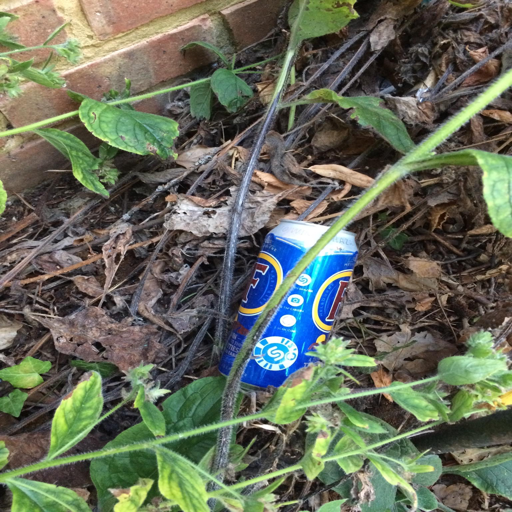

In [60]:
sample_idx = 0

image_tensor, target = tiny_train_dataset[sample_idx]

# image_tensor is [C, H, W] in float32 [0, 1]
image_np = (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
pil_image = Image.fromarray(image_np)

pil_image.resize((512, 512))

In [48]:
target['boxes']

tensor([[ 652.,  874., 1077., 1563.]])

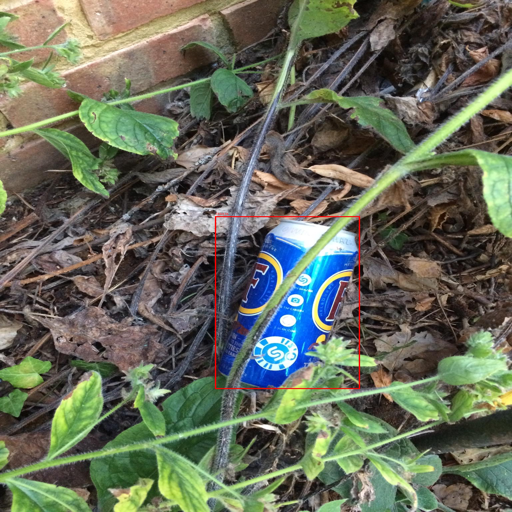

In [62]:
score_threshold = 0.003

result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=0.01)

img_with_boxes = Image.fromarray(
    (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_with_boxes)

pred_boxes = result["pred"]["boxes"]
pred_labels = result["pred"]["labels"]
pred_scores = result["pred"]["scores"]

top_k = 1
for box, label, score in zip(
      result["pred"]["boxes"][:top_k],
      result["pred"]["labels"][:top_k],
      result["pred"]["scores"][:top_k],
  ):
    if float(score) < score_threshold:
        continue

    x1, y1, x2, y2 = box.tolist()
    draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
    draw.text((x1, max(0, y1 - 15)), f"{int(label)}:{float(score):.3f}", fill="red")

img_with_boxes.resize((512, 512))

In [63]:
print("gt boxes:", result["target"]["boxes"])
print("top pred boxes:", result["pred"]["boxes"][:5])
print("top pred labels:", result["pred"]["labels"][:5])
print("top pred scores:", result["pred"]["scores"][:5])

gt boxes: tensor([[ 652.,  874., 1077., 1563.]])
top pred boxes: tensor([[ 645.7323,  865.1891, 1080.2966, 1556.9310],
        [ 493.5832,  988.7657, 1209.9794, 1456.1185],
        [ 543.7176,  687.5146, 1132.4659, 1728.6219],
        [ 692.7880, 1005.4814,  976.6407, 1315.6575],
        [ 679.4895,  967.2665,  866.7606, 1410.2563]])
top pred labels: tensor([13, 13, 13, 13, 13])
top pred scores: tensor([0.5157, 0.1965, 0.0962, 0.0189, 0.0161])


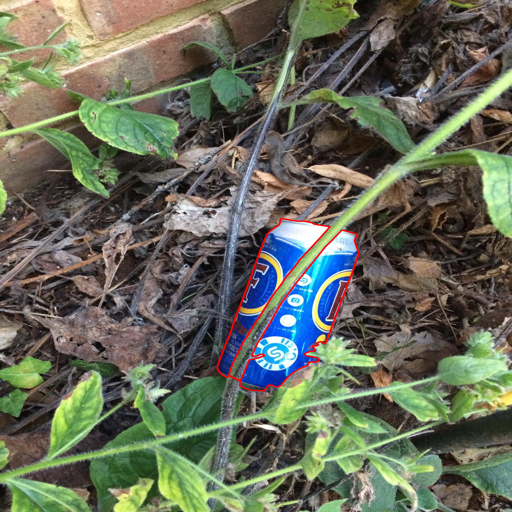

In [64]:
image_tensor, target = tiny_train_dataset[sample_idx]

img_contour = Image.fromarray(
    (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_contour)

masks = target["masks"].cpu().numpy()  # [N, H, W]
thickness = 5
r = thickness // 2

for mask in masks:
    mask = mask.astype(bool)

    # boundary pixels: mask pixels that have at least one neighbor outside the mask
    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_contour.resize((512, 512))

In [52]:
masks

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint8)

### 3 image overfit

In [68]:
clear_memory()

In [69]:
num_epochs = 300
model = get_model(num_classes=num_classes, train_mode="all")
tiny_train_dataset = Subset(train_dataset, [15,49,128])
tiny_train_loader = DataLoader(
    tiny_train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.01,
    momentum=0.9,
    weight_decay=0.0005,
)

# lr_scheduler = torch.optim.lr_scheduler.StepLR(
#     optimizer,
#     step_size=10,
#     gamma=0.1,
# )

scaler = torch.cuda.amp.GradScaler()

history = {"train": [], "eval": []}

for epoch in range(1, num_epochs + 1):
    train_metrics = fit_one_epoch(
        model=model,
        optimizer=optimizer,
        train_dataloader=tiny_train_loader,
        device=device,
        epoch=epoch,
        scaler=scaler,
    )
    history["train"].append(train_metrics)
    # if print_debug:
    #     print(train_metrics)

    if epoch % 10 == 0:
        model.roi_heads.score_thresh = 0.7
        model.roi_heads.detections_per_img = 3
        eval_summary = eval_one_epoch(
            model=model,
            val_dataloader=tiny_train_loader,
            device=device,
            epoch=epoch,
            score_threshold=0.0,
        )
        history['eval'].append(eval_summary)
        # if print_debug:
        #     print(f"epoch={epoch}")
        #     print(train_metrics)
        #     print(eval_summary)

    # lr_scheduler.step()


/tmp/ipykernel_4237/1373976579.py:24: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 300. Eval: 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]


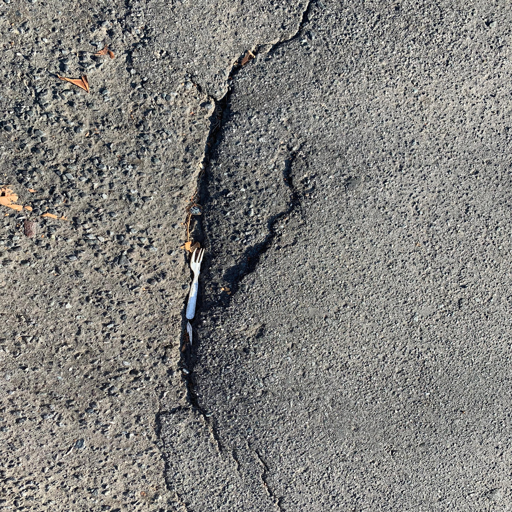

In [88]:
sample_idx = 2

image_tensor, target = tiny_train_dataset[sample_idx]

# image_tensor is [C, H, W] in float32 [0, 1]
image_np = (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
pil_image = Image.fromarray(image_np)

pil_image.resize((512, 512))

In [ ]:
result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=score_threshold)
target['boxes'], result['pred']['boxes']

(tensor([[1098., 1952., 1206., 2514.],
         [1103., 2533., 1137., 2722.],
         [1098., 1604., 1194., 1693.]]),
 tensor([[1098.7520, 1601.3450, 1193.7744, 1691.6101],
         [1104.4347, 2531.5264, 1136.5289, 2717.4167],
         [1098.4419, 1942.7913, 1205.9606, 2522.9797],
         [1105.7329, 1985.0819, 1176.3839, 2547.2676],
         [1102.9365, 2516.4233, 1154.3354, 2723.3655]]))

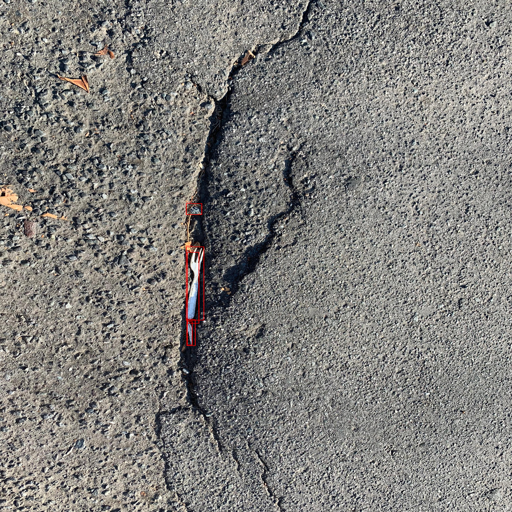

In [ ]:
score_threshold = 0.0

result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=score_threshold)

img_with_boxes = Image.fromarray(
    (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_with_boxes)

pred_boxes = result["pred"]["boxes"]
pred_labels = result["pred"]["labels"]
pred_scores = result["pred"]["scores"]

top_k = 5
for box, label, score in zip(
      result["pred"]["boxes"][:top_k],
      result["pred"]["labels"][:top_k],
      result["pred"]["scores"][:top_k],
  ):
    if float(score) < score_threshold:
        continue

    x1, y1, x2, y2 = box.tolist()
    draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
    draw.text((x1, max(0, y1 - 15)), f"{int(label)}:{float(score):.3f}", fill="red")

img_with_boxes.resize((512, 512))

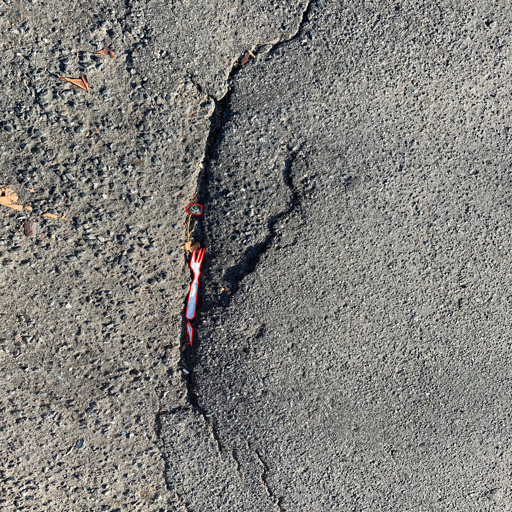

In [93]:
image_tensor, target = tiny_train_dataset[sample_idx]

img_contour = Image.fromarray(
    (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_contour)

masks = target["masks"].cpu().numpy()  # [N, H, W]
thickness = 5
r = thickness // 2

for mask in masks:
    mask = mask.astype(bool)

    # boundary pixels: mask pixels that have at least one neighbor outside the mask
    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_contour.resize((512, 512))

### 8 image overfit

In [170]:
@torch.no_grad()
def predict_one_sample_top1(model, dataset, idx, device):
    model.eval()

    image, target = dataset[idx]
    output = model([image.to(device)])[0]

    result = {
        "image": image.cpu(),
        "target": {
            k: v.cpu() if isinstance(v, torch.Tensor) else v
            for k, v in target.items()
        },
        "pred": None,
    }

    if len(output["boxes"]) > 0:
        result["pred"] = {
            "box": output["boxes"][0].detach().cpu(),
            "label": int(output["labels"][0].detach().cpu()),
            "score": float(output["scores"][0].detach().cpu()),
            "mask": output["masks"][0].detach().cpu(),
        }

    return result

In [171]:
def show_top1_box(result):
    img = Image.fromarray(
        (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
    ).copy()

    draw = ImageDraw.Draw(img)

    # GT box in green
    for gt_box in result["target"]["boxes"]:
        x1, y1, x2, y2 = gt_box.tolist()
        draw.rectangle([x1, y1, x2, y2], outline="lime", width=4)

    # Top-1 pred in red
    if result["pred"] is not None:
        x1, y1, x2, y2 = result["pred"]["box"].tolist()
        draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
        draw.text(
            (x1, max(0, y1 - 15)),
            f"{result['pred']['label']}:{result['pred']['score']:.3f}",
            fill="red",
        )

    return img

In [172]:
def show_top1_mask_raw(result):
    if result["pred"] is None:
        return None

    mask = result["pred"]["mask"].squeeze().cpu().numpy()

    mask_img = Image.fromarray((mask * 255).astype(np.uint8))
    return mask_img


def show_top1_mask_binary(result, threshold=0.3):
    if result["pred"] is None:
        return None

    mask = result["pred"]["mask"].squeeze().cpu().numpy()
    binary = (mask >= threshold).astype(np.uint8) * 255
    return Image.fromarray(binary)

In [94]:
# ids of the subset 
ids = np.random.choice(1200, size=8, replace=False)
ids

array([1178,  865,  101,  439,   58, 1120,  323,  974])

In [134]:
clear_memory()

In [200]:
num_epochs = 250
model = get_model(num_classes=num_classes, train_mode="heads")
tiny_train_dataset = Subset(train_dataset, ids)
tiny_train_loader = DataLoader(
    tiny_train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.001,
    momentum=0.9,
    weight_decay=0.0005,
)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=50,
    gamma=0.1,
)

scaler = torch.cuda.amp.GradScaler()

history = {"train": [], "eval": []}

for epoch in range(1, num_epochs + 1):
    train_metrics = fit_one_epoch(
        model=model,
        optimizer=optimizer,
        train_dataloader=tiny_train_loader,
        device=device,
        epoch=epoch,
        scaler=scaler,
    )
    history["train"].append(train_metrics)
    # if print_debug:
    #     print(train_metrics)

    if epoch % 10 == 0:
        eval_summary = eval_one_epoch(
            model=model,
            val_dataloader=tiny_train_loader,
            device=device,
            epoch=epoch,
            score_threshold=0.0,
        )
        history['eval'].append(eval_summary)
        # if print_debug:
        #     print(f"epoch={epoch}")
        #     print(train_metrics)
        #     print(eval_summary)

    lr_scheduler.step()


/tmp/ipykernel_4237/2738006976.py:24: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 250. Eval: 100%|██████████| 8/8 [00:01<00:00,  4.08it/s]


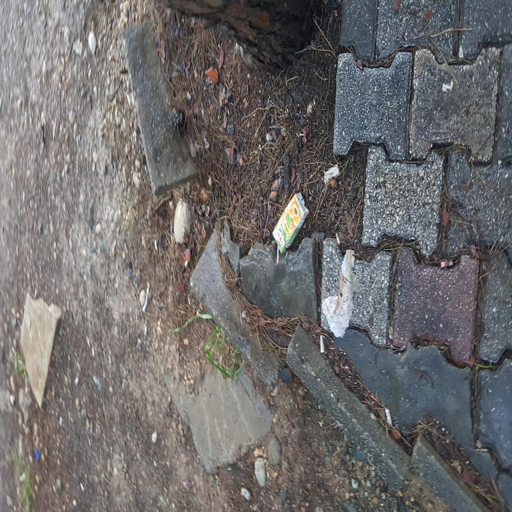

In [225]:
sample_idx = 5

image_tensor, target = tiny_train_dataset[sample_idx]

# image_tensor is [C, H, W] in float32 [0, 1]
image_np = (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
pil_image = Image.fromarray(image_np)

pil_image.resize((512, 512))

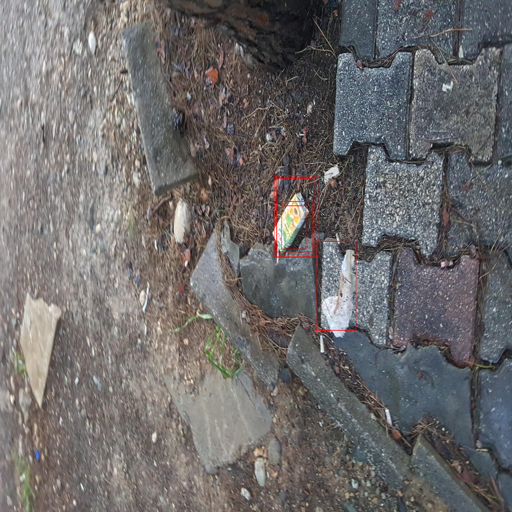

In [226]:
score_threshold = 0.0

result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=score_threshold)

img_with_boxes = Image.fromarray(
    (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_with_boxes)

pred_boxes = result["pred"]["boxes"]
pred_labels = result["pred"]["labels"]
pred_scores = result["pred"]["scores"]

top_k = 5
for box, label, score in zip(
      result["pred"]["boxes"][:top_k],
      result["pred"]["labels"][:top_k],
      result["pred"]["scores"][:top_k],
  ):
    if float(score) < score_threshold:
        continue

    x1, y1, x2, y2 = box.tolist()
    draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
    draw.text((x1, max(0, y1 - 15)), f"{int(label)}:{float(score):.3f}", fill="red")

img_with_boxes.resize((512, 512))

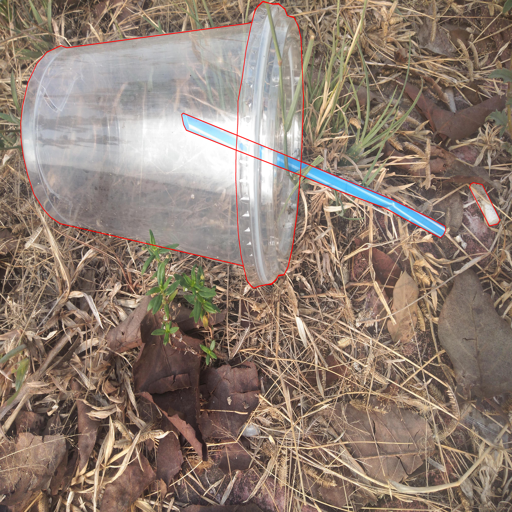

In [301]:
image_tensor, target = tiny_train_dataset[sample_idx]

img_contour = Image.fromarray(
    (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_contour)

masks = target["masks"].cpu().numpy()  # [N, H, W]
thickness = 5
r = thickness // 2

for mask in masks:
    mask = mask.astype(bool)

    # boundary pixels: mask pixels that have at least one neighbor outside the mask
    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_contour.resize((512, 512))

### Overfit 32 images

In [228]:
# ids of the subset 
ids = np.random.choice(1200, size=32, replace=False)
ids

array([ 410,  199,   82, 1124, 1038,  891,  254,  595,   47,  255,  644,
        510,  528,   93,  770,  111,  740,  851,  657,  998,  684,  498,
       1016,  188,  969,  486,  134,  736,  705,  833,  993,   56])

In [229]:
num_epochs = 50
model = get_model(num_classes=num_classes, train_mode="heads")
tiny_train_dataset = Subset(train_dataset, ids)
tiny_train_loader = DataLoader(
    tiny_train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.001,
    momentum=0.9,
    weight_decay=0.0005,
)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=50,
    gamma=0.1,
)

scaler = torch.cuda.amp.GradScaler()

history = {"train": [], "eval": []}

for epoch in range(1, num_epochs + 1):
    train_metrics = fit_one_epoch(
        model=model,
        optimizer=optimizer,
        train_dataloader=tiny_train_loader,
        device=device,
        epoch=epoch,
        scaler=scaler,
    )
    history["train"].append(train_metrics)
    # if print_debug:
    #     print(train_metrics)

    if epoch % 10 == 0:
        eval_summary = eval_one_epoch(
            model=model,
            val_dataloader=tiny_train_loader,
            device=device,
            epoch=epoch,
            score_threshold=0.0,
        )
        history['eval'].append(eval_summary)
        # if print_debug:
        #     print(f"epoch={epoch}")
        #     print(train_metrics)
        #     print(eval_summary)

    lr_scheduler.step()


/tmp/ipykernel_4237/2862404408.py:24: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 50. Eval: 100%|██████████| 32/32 [00:10<00:00,  3.05it/s]


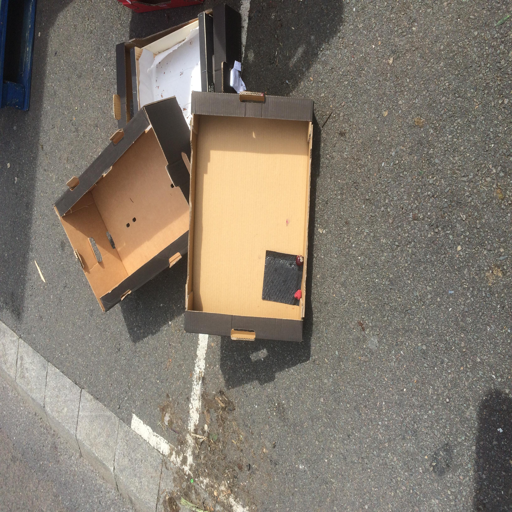

In [314]:
sample_idx = 20

image_tensor, target = tiny_train_dataset[sample_idx]

# image_tensor is [C, H, W] in float32 [0, 1]
image_np = (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
pil_image = Image.fromarray(image_np)

pil_image.resize((512, 512))

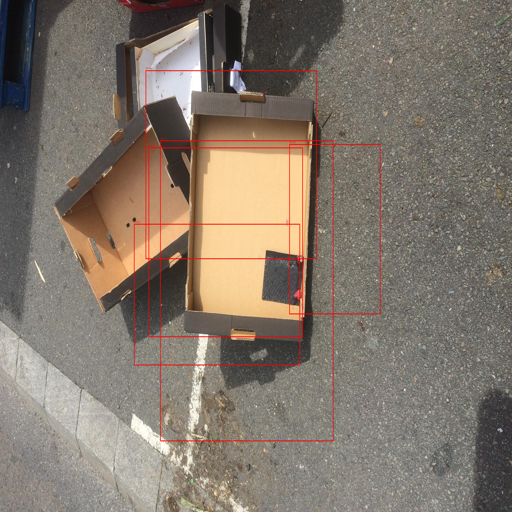

In [315]:
score_threshold = 0.0

result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=score_threshold)

img_with_boxes = Image.fromarray(
    (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_with_boxes)

pred_boxes = result["pred"]["boxes"]
pred_labels = result["pred"]["labels"]
pred_scores = result["pred"]["scores"]

top_k = 5
for box, label, score in zip(
      result["pred"]["boxes"][:top_k],
      result["pred"]["labels"][:top_k],
      result["pred"]["scores"][:top_k],
  ):
    if float(score) < score_threshold:
        continue

    x1, y1, x2, y2 = box.tolist()
    draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
    draw.text((x1, max(0, y1 - 15)), f"{int(label)}:{float(score):.3f}", fill="red")

img_with_boxes.resize((512, 512))

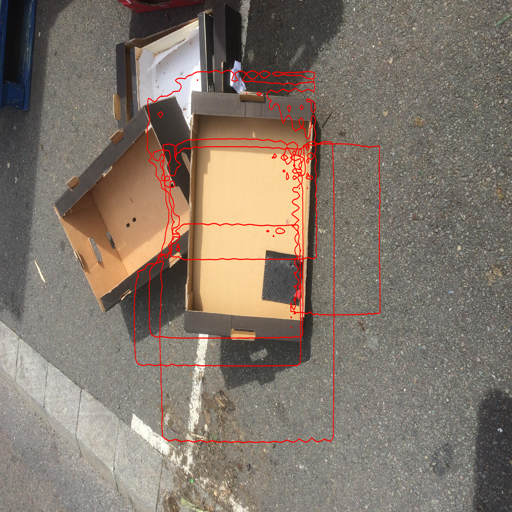

In [316]:
image_tensor, target = tiny_train_dataset[sample_idx]

img_contour = Image.fromarray(
    (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_contour)

masks = result["pred"]["masks"].cpu().numpy()   # [N, 1, H, W]
thickness = 5
r = thickness // 2

for mask in masks:
    mask = (mask.squeeze(0) >= 0.3)   # [H, W]

    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_contour.resize((512, 512))